### Figures
1. CRC TF venn diagram
2. degree heatmap
3. CRC network

### Tables
1. CRC TF (paper vs recovered)

# Venn diagram 

In [64]:
import sys
import numpy as np
import pandas as pd
sys.path.append('/project/NeuralNet/software/miniconda3/envs/genetics/lib/python3.7/site-packages')

import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles

In [164]:
df = pd.DataFrame(np.array(["DE_paper", "DE_narrow.05_broad.05_exclNMtss", 30, 28, 25, 
                            "Beta_paper", "Beta_narrow.05_broad.1_incltss_cutoff500", 46, 32, 30, 
                            "Beta_paper", "Beta_macs2", 46,66,32,
                            "Beta_paper", "Beta_crup", 46, 62,39,
                            "Beta_paper", "Beta_trap", 46, 39, 28,
                            "Beta_paper", "HI32_trap", 46, 37, 27,
                            #"Beta_paper", "HI-32_H3K27ac_incltss", 46, 62, 39, 
                            #"Beta_paper", "HI-32_H3K27ac_incltss_cutoff500", 46, 34, 28, 
                            #"Alpha_Beta_paper", "HI-32_H3K27ac_incltss", 60, 62, 46, 
                            #"Alpha_Beta_paper", "HI-32_H3K27ac_incltss_cutoff500", 60, 34, 30,
                            #"Beta_paper", "Beta_narrow.05_broad.1_incltss_cutoff500 (TAD)", 46, 63, 28,
                           ]).reshape(6, 5),
                  columns=["A", "B", "#A", "#B", "#AB"])

In [165]:
df = df.apply(pd.to_numeric, errors='ignore')
print(df.dtypes)
df

A      object
B      object
#A      int64
#B      int64
#AB     int64
dtype: object


,A,B,#A,#B,#AB
0,DE_paper,DE_narrow.05_broad.05_exclNMtss,30,28,25
1,Beta_paper,Beta_narrow.05_broad.1_incltss_cutoff500,46,32,30
2,Beta_paper,Beta_macs2,46,66,32
3,Beta_paper,Beta_crup,46,62,39
4,Beta_paper,Beta_trap,46,39,28
5,Beta_paper,HI32_trap,46,37,27


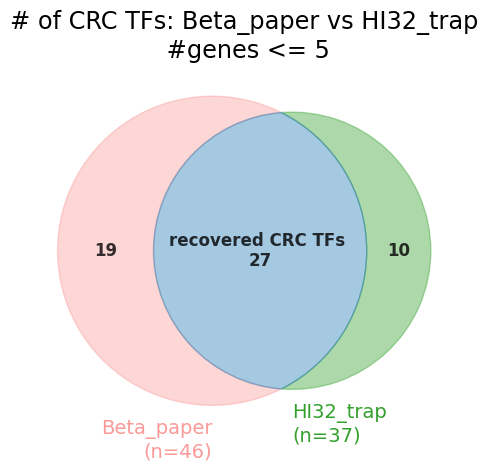

In [167]:
# Ab, aB, AB
# 10, 01, 11

v2 = venn2(subsets = {"10": (df['#A'] - df["#AB"])[5],
                      "01": (df['#B'] - df["#AB"])[5],
                      "11": df["#AB"][5]}, 
           set_labels = (f"{df.A[5]}\n(n={df['#A'][5]})", f"{df.B[5]}\n(n={df['#B'][5]})"))

# colors = ["darkblue", "teal", "red"]
colors = ['#fb9a99','#33a02c','#1f78b4']
i = 0
for text in v2.set_labels:
    text.set_fontsize(14)                  #set label's fontsize 
    text.set_color(colors[i])                 #set label's font colour
    i += 1

IDs = ["10", "01", "11"]
i = 0
for ids in IDs:
    v2.get_patch_by_id(ids).set_color(colors[i])
    i += 1
    
for text in v2.subset_labels:
    text.set_fontsize(12)                #set circle's value fontsize 
    text.set_color('black')              #set circle's value font colour
    text.set_fontweight('bold')
    text.set_alpha(0.8)                    #set circle's value font transparency

v2.get_label_by_id('11').set_text(f'recovered CRC TFs \n{df["#AB"][5]}')

plt.title(f"# of CRC TFs: {df.A[5]} vs {df.B[5]}\n #genes <= 5", fontsize='xx-large', loc="center") #set title
#plt.show()
plt.savefig('./thesis_fig/R3_HI32_trap_overlap_venn.svg', dpi=100)

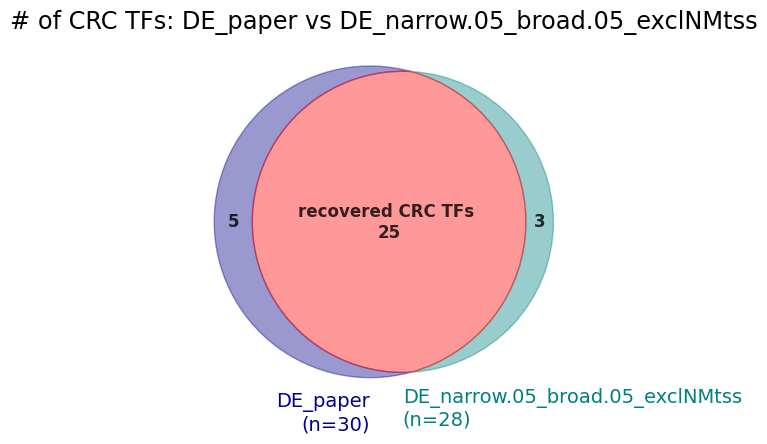

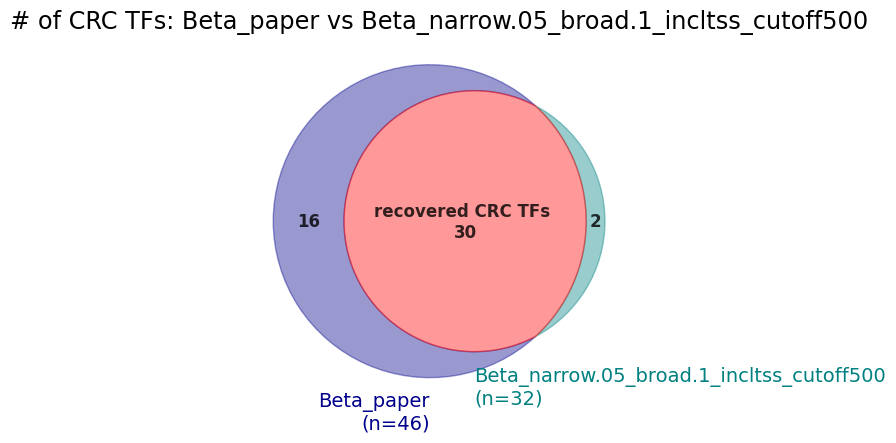

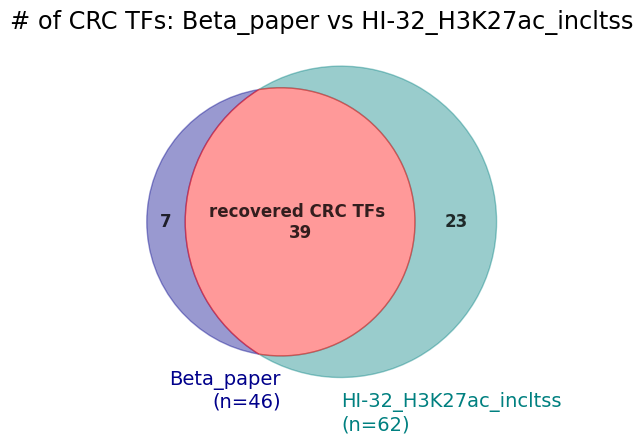

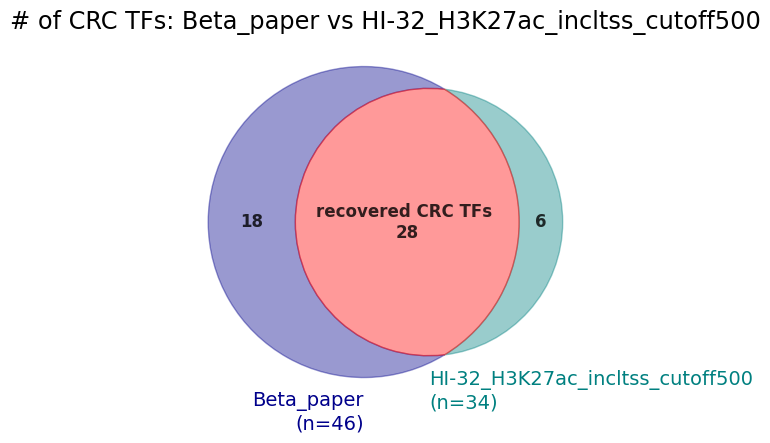

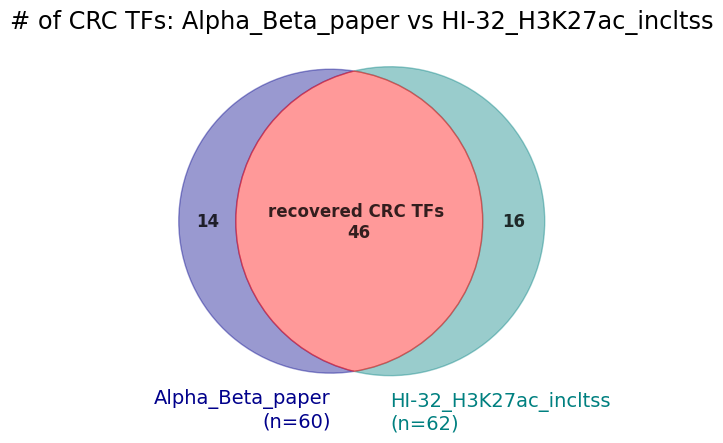

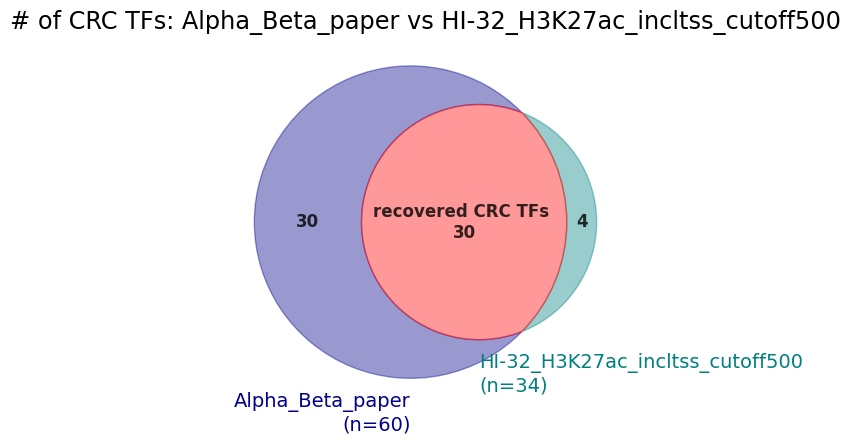

In [379]:
for i in range(df.shape[0]):
    # print(df.iloc[i])
    v2 = venn2(subsets = {"10": (df['#A'] - df["#AB"])[i],
                          "01": (df['#B'] - df["#AB"])[i],
                          "11": df["#AB"][i]}, 
               set_labels = (f"{df.A[i]}\n(n={df['#A'][i]})", f"{df.B[i]}\n(n={df['#B'][i]})"))
    
    colors = ["darkblue", "teal", "red"]
    j = 0
    for text in v2.set_labels:
        text.set_fontsize(14)                  #set label's fontsize 
        text.set_color(colors[j])                 #set label's font colour
        j += 1

    IDs = ["10", "01", "11"]
    j = 0
    for ids in IDs:
        v2.get_patch_by_id(ids).set_color(colors[j])
        j += 1
    
    for text in v2.subset_labels:
        text.set_fontsize(12)                #set circle's value fontsize 
        text.set_color('black')              #set circle's value font colour
        text.set_fontweight('bold')
        text.set_alpha(0.8)                    #set circle's value font transparency
        
    v2.get_label_by_id('11').set_text(f'recovered CRC TFs \n{df["#AB"][i]}')

    plt.title(f"# of CRC TFs: {df.A[i]} vs {df.B[i]}", fontsize='xx-large', loc="center") #set title
    plt.show()

# degree heatmap

In [2]:
# ref:
## plot heatmap: https://indianaiproduction.com/seaborn-heatmap/
## user-defined cmap: https://zhajiman.github.io/post/matplotlib_colormap/
## color name abbr: https://stackoverflow.com/questions/22408237/named-colors-in-matplotlib
## add legend to network: https://stackoverflow.com/questions/38534730/add-legend-to-networks-plot-to-explain-colouring-of-nodes

In [51]:
# necessary functions
def parseTable(fn, sep, header = False,excel = False):
    '''takes in a table where columns are separated by a given symbol and outputs
    a nested list such that list[row][col]
    example call:
    table = parseTable('file.txt','\t')
    '''
    fh = open(fn)
    lines = fh.readlines()
    fh.close()
    if excel:
        lines = lines[0].split('\r')
    if lines[0].count('\r') > 0:
        lines = lines[0].split('\r')
    table = []
    if header == True:
        lines =lines[1:]
    for i in lines:
        table.append(i[:-1].split(sep))

    return table

In [52]:
import os
import sys
#import openpyxl
import numpy as np
import pandas as pd
sys.path.append('/project/NeuralNet/software/miniconda3/envs/genetics/lib/python3.7/site-packages')


import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import networkx as nx
from sklearn.preprocessing import normalize
from networkx.algorithms.clique import find_cliques_recursive

In [304]:
def plotDegree(CRC, title, cmap, vmax=None, figsize=(25,25)):
    
    # get each clique from the CRC output
    cliqueList = []
    for i in CRC['CRC_TFs']:
        cliqueList.append(eval(i))
    print(f'first CRC is [{cliqueList[0]}]')
    
    # calculating degree for each node (TF) in the CRC
    ## degree of undirected graph
    ## including the degree of self-loop
    ## reason why using dict rather list: query speed of dictionary >> list

    ### 1. counting edges
    edgeCountDict = {}
    for clique in cliqueList:
        for TF in clique:
            for (source, target) in zip([TF] * len(clique), clique):
            # this for loop generate interactions (source, target) in each clique
                if (source, target) not in edgeCountDict.keys():
                    edgeCountDict[(source, target)] = 0
                else:
                    edgeCountDict[(source, target)] += 1
    
    ### 2. counting the occurrences of source nodes among edges => degree of nodes
    degreeDict = {}
    for (source, target) in edgeCountDict.keys():
        if source not in degreeDict.keys():
            degreeDict[source] = 1
        else:
            degreeDict[source] += 1
            
    ### 3. into sorted df
    degree = pd.DataFrame(degreeDict.items(), columns=['TF','degree'])
    # degree = pd.DataFrame.from_dict(degreeDict, orient='index')
    degree.sort_values(by=['degree', 'TF'], ascending=[False, True], inplace=True)
    print(f'top 5 TF: \n{degree.head(5)}')
    
    ### 4. plot degree heatmap
    plt.figure(figsize=figsize, dpi=100)
    plt.title(title, fontsize=16)
    cbar_kws = {'shrink':0.5,}
    kwargs = {'alpha':.75, 'linewidths':0.0, 'linecolor':'k', 'cmap': cmap, 'vmin': 0, 'vmax': vmax,
              'clip_on':False, 'annot': True, 'fmt':'g', 'square': True, 'xticklabels': False,
              'yticklabels': degree['TF'].to_list(),
              'cbar_kws': cbar_kws}
    # sns.heatmap([degree['degree'].to_list()], **kwargs)
    ax = sns.heatmap(np.array([degree['degree'].to_list()]).T, **kwargs)
    ax.tick_params(axis='both', which='both', length=0)
    
    plt.tight_layout()
    plt.yticks(rotation=0)
    #plt.savefig('./thesis_fig/'+'_'.join(title.split())+'.svg', dpi=100)
    plt.show()
    
    return degree, edgeCountDict



In [124]:
def plotNetwork(edgeCountDict, title, cmap, vmax=None):
    # in order to recreate similar network as in the paper, extract nodes of the network from the paper
    # nodeListPaper = ['JUNB', 'ISL1', 'INSM1', 'HOXC4', 'GLIS3', 'FOXK1', 'BHLHE40', 'BHLHE41', 'ZBTB16', 'TFEB', 'SOX9', 'SOX11', 'RREB1', 'RARB', 'POU2F2', 'PKNOX2', 'PDX1', 'PAX6', 'PAX4', 'ONECUT1', 'NR4A2', 'NR3C1', 'NKX6-3', 'NKX6-1', 'MNX1', 'MEIS1', 'MAFA', 'MX1B', 'KLF3']
    nodeListPaper = ['ZIC3', 'ZIC2', 'TCF7L2', 'LHX1', 'OTX2', 'EOMES', 'PITX2', 'SOX4', 'TCF7L1', 'FOXA2', 'FOXK1', 'SOX9', 'RFX1', 'FOXJ2', 'ARID3A', 'JUND', 'MEIS2', 'FOXA2', 'NR4A2', 'PDX1', 'KLF13']
    
    edgeListPaper = []
    for pair in edgeCountDict.keys():
        if nodeListPaper.count(pair[0]) and nodeListPaper.count(pair[1]):
            edgeListPaper.append(pair)
    
    # constructing network
    title = title
    plt.figure(figsize=(12,10), dpi=100)
    plt.title(title, fontsize=16)
    G = nx.Graph()
    G.add_nodes_from(nodeListPaper)
    G.add_edges_from(edgeListPaper)
    pos = nx.circular_layout(G)
    nx.draw_networkx_edges(G, pos)
    nx.draw_networkx_labels(G, pos)
    node_color = [G.degree(v) for v in G]
    network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=cmap, node_size=1200, vmin=0, vmax=vmax)
    plt.colorbar(network)
    #plt.show()
    plt.savefig('./thesis_fig/'+'_'.join(title.split())+'.pdf', dpi=100)

In [ ]:
def plotDegree2(edges, title, cmap, figsize=(25, 25), vmax=None):
    
    ### 1. count degree
    degreeDict = {}
    for edge in edges:
        TF1 = edge[0]
        TF2 = edge[1]

        if TF1 not in degreeDict.keys():
            degreeDict[TF1] = 0
            degreeDict[TF1] += 1
        else:
            degreeDict[TF1] += 1

    ### 3. into sorted df
    degree = pd.DataFrame(degreeDict.items(), columns=['TF','degree'])
    # degree = pd.DataFrame.from_dict(degreeDict, orient='index')
    degree.sort_values(by=['degree', 'TF'], ascending=[False, True], inplace=True)
    print(f'top 5 TF: \n{degree.head(5)}')
    
    ### 4. plot degree heatmap
    plt.figure(figsize=figsize, dpi=100)
    plt.title(title, fontsize=16)
    cbar_kws = {'shrink':0.5,}
    kwargs = {'alpha':.75, 'linewidths':0.0, 'linecolor':'k', 'cmap': cmap, 'vmin': 0, 'vmax': vmax,
              'clip_on':False, 'annot': True, 'fmt':'g', 'square': True, 'xticklabels': False,
              'yticklabels': degree['TF'].to_list(),
              'cbar_kws': cbar_kws}
    # sns.heatmap([degree['degree'].to_list()], **kwargs)
    ax = sns.heatmap(np.array([degree['degree'].to_list()]).T, **kwargs)
    ax.tick_params(axis='both', which='both', length=0)
    # ax.axis('scaled')
    
    plt.tight_layout()
    plt.yticks(rotation=0)
    plt.savefig('./thesis_fig/'+'_'.join(title.split())+'.pdf', dpi=100,)  # bbox_inches='tight'
    plt.show()
    
    return degree



In [119]:
def plotNetwork2(edgeCountDict, title, cmap, vmax=None):
    # in order to recreate similar network as in the paper, extract nodes of the network from the paper
    #nodeListPaper = ['JUNB', 'ISL1', 'INSM1', 'HOXC4', 'GLIS3', 'FOXK1', 'BHLHE40', 'BHLHE41', 'ZBTB16', 'TFEB', 'SOX9', 'SOX11', 'RREB1', 'RARB', 'POU2F2', 'PKNOX2', 'PDX1', 'PAX6', 'PAX4', 'ONECUT1', 'NR4A2', 'NR3C1', 'NKX6-3', 'NKX6-1', 'MNX1', 'MEIS1', 'MAFA', 'MX1B', 'KLF3']
    
    nodeListPaper = ['ZIC3', 'ZIC2', 'TCF7L2', 'LHX1', 'OTX2', 'EOMES', 'PITX2', 'SOX4', 'TCF7L1', 'FOXA2', 'FOXK1', 'SOX9', 'RFX1', 'FOXJ2', 'ARID3A', 'JUND', 'MEIS2', 'FOXA2', 'NR4A2', 'PDX1', 'KLF13']
    
    edgeListPaper = []
    for pair in edgeCountDict.keys():
        if nodeListPaper.count(pair[0]) and nodeListPaper.count(pair[1]):
            edgeListPaper.append(pair)
    
    # constructing network
    title = title
    plt.figure(figsize=(12,10), dpi=100)
    plt.title(title, fontsize=16)
    G = nx.Graph()
    G.add_nodes_from(nodeListPaper)
    G.add_edges_from(edgeListPaper)
    pos = nx.circular_layout(G)
    nx.draw_networkx_edges(G, pos)
    nx.draw_networkx_labels(G, pos)
    node_color = [G.degree(v) for v in G]
    network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=cmap, node_size=1200, vmin=0, vmax=vmax)
    plt.colorbar(network)
    plit.show()
    #plt.savefig('./'+'_'.join(title.split())+'.pdf', dpi=100)

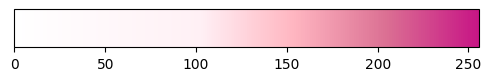

In [57]:
def show_cmap(cmap, norm=None, extend=None):
    '''展示一个colormap.'''
    if norm is None:
        norm = mcolors.Normalize(vmin=0, vmax=cmap.N)
    im = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)
    fig.colorbar(im, cax=ax, orientation='horizontal', extend=extend)
    plt.show()

colors = ['white', 'lavenderblush', 'lightpink', 'palevioletred', 'mediumvioletred']
nodes = [0, 0.4, 0.6, 0.8, 1]
BetaDegreeCmap = mcolors.LinearSegmentedColormap.from_list('cmap1', list(zip(nodes, colors)))
show_cmap(BetaDegreeCmap)

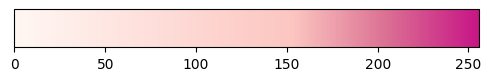

In [108]:
# colors = ['gainsboro', 'lightpink', 'palevioletred', 'mediumvioletred']
# colors = ['#fff7f3','#fde0dd','#fcc5c0','#fa9fb5','#dd3497']
colors = ['#fff7f3', '#fcc5c0', 'palevioletred', 'mediumvioletred']
nodes = [0, 0.6, 0.8, 1]
BetaCRCcmap = mcolors.LinearSegmentedColormap.from_list('cmap1', list(zip(nodes, colors)))
show_cmap(BetaCRCcmap)

## degree heatmap of Beta cell (paper)

In [302]:
wb = pd.ExcelFile('/home/jieyidi/Downloads/Meissner2019/1-s2.0-S1934590919304667-mmc7_CRC.xlsx')
wb.sheet_names

['hPSC', 'DE', 'PP1', 'PP2', 'EN', 'SC-beta', 'PH', 'Alpha', 'Beta']

In [303]:
betaCRCinPaper = wb.parse('Beta')
betaCRCinPaper.head(5)

,CRC#,CRC_TFs,score,#TFs
0,1,"['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'M...",412.705882,17
1,2,"['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'M...",411.823529,17
2,3,"['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'M...",400.705882,17
3,4,"['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'M...",400.312500,16
4,5,"['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'M...",399.823529,17


first CRC is [['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'MEIS2', 'PDX1', 'PAX6', 'MEF2D', 'SMAD3', 'NFE2L2', 'INSM1', 'RFX2', 'KLF13', 'RARA', 'SOX13', 'NKX2-2']]
top 5 TF: 
       TF  degree
2   FOXA2      45
0   FOXK1      45
26  TEAD1      45
11  INSM1      44
5   MEIS2      44


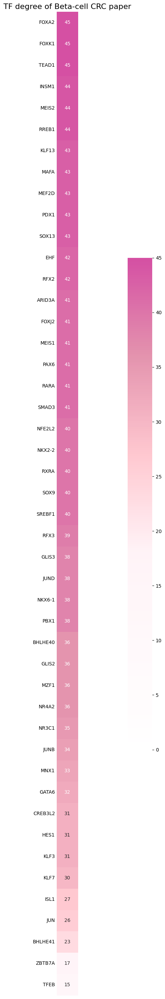

In [305]:
title = 'TF degree of Beta-cell CRC paper'
degree_paper, edgeCountDict = plotDegree(CRC = betaCRCinPaper, title = title, cmap = BetaDegreeCmap, figsize=(29,29))

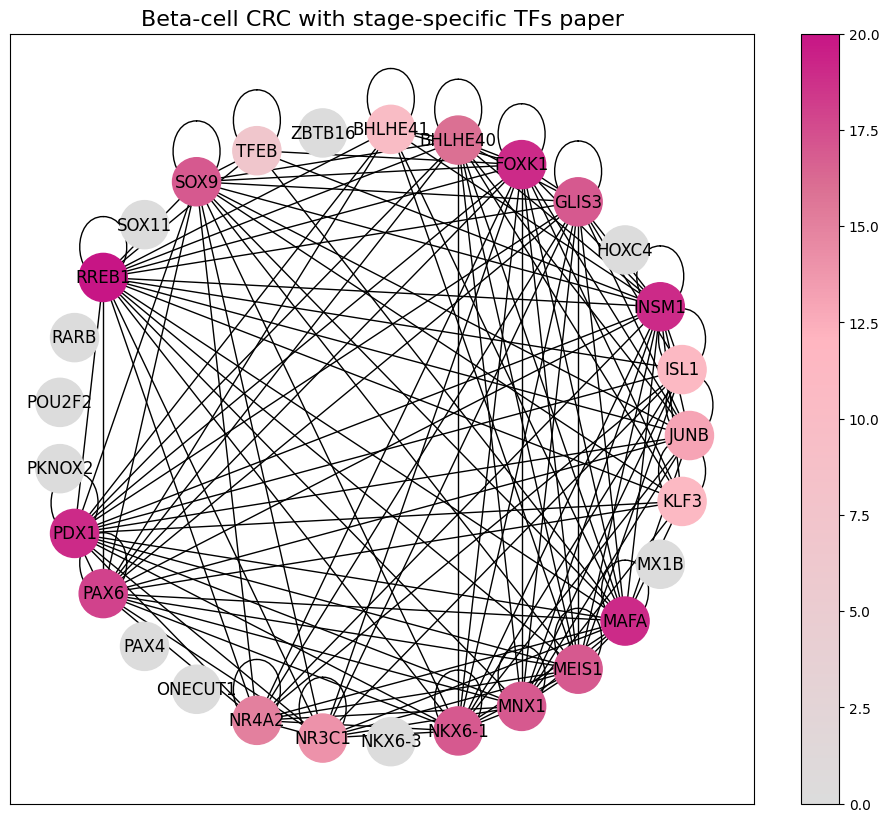

In [339]:
title = 'Beta-cell CRC with stage-specific TFs paper'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap)

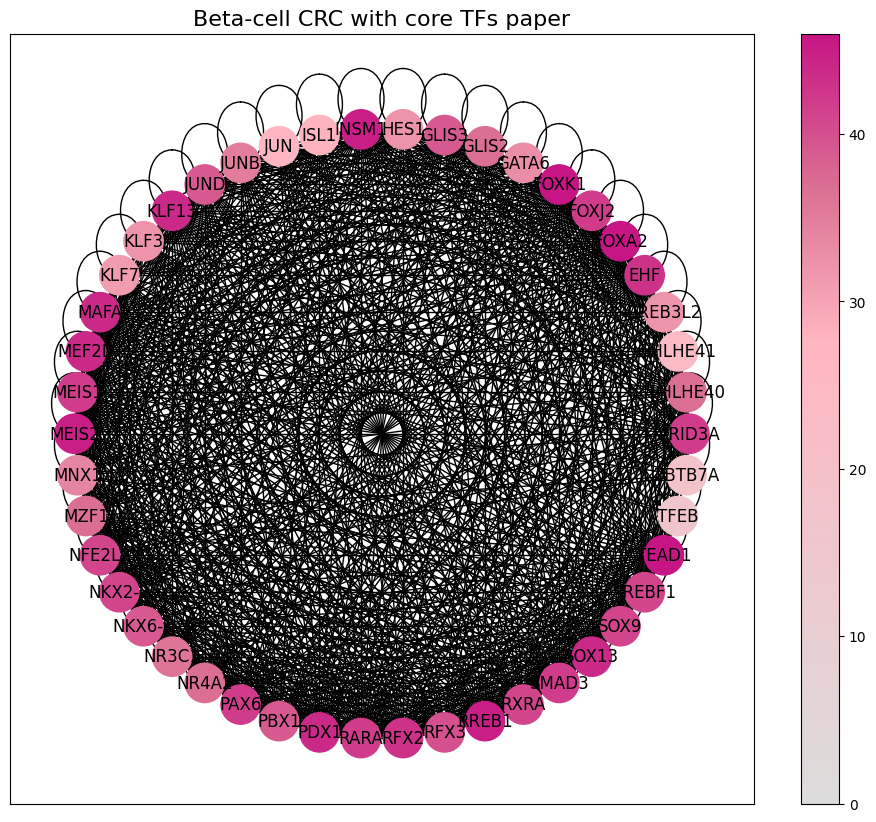

In [341]:
# DE CRC composed of all autoregulatory TFs
nodeList = sorted(degree['TF'].to_list())

edgeList = []
for pair in edgeCountDict.keys():
    edgeList.append(pair)

# constructing network
title = 'Beta-cell CRC with core TFs paper'
plt.figure(figsize=(12,10), dpi=100)
plt.title(title, fontsize=16)
G = nx.Graph()
G.add_nodes_from(nodeList)
G.add_edges_from(edgeList)
pos = nx.circular_layout(G)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G, pos)
node_color = [G.degree(v) for v in G]
network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=mycmap, node_size=800, vmin=0)
plt.colorbar(network)
plt.savefig('./visualization/'+'_'.join(title.split())+'.pdf', dpi=100)
# plt.show()

## degree heatmap of Beta cell (recapitulation)

In [399]:
# betaCRC = pd.read_csv('../CRCmapper/2-2.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/Beta_CRC_SCORES.txt', 
                      #header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
#betaCRC = pd.read_csv('../CRCmapper/2-1.crc_macs2_HI-32_K27ac_narrow.05_broad.05_incltss_cutoffSE_ext500/H3K27ac_HI-32_CRC_SCORES.txt', 
                      #header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
betaCRC = pd.read_csv('../CRCmapper/1-1.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext0/H3K27ac_HI-32_CRC_SCORES.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
# betaCRC = pd.read_csv('../CRCmapper/3-1.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/H3K27ac_HI-32_CRC_SCORES.txt', 
                      # header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
betaCRC.head(5)

,CRC_TFs,score,#TFs
0,"['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'T...",1213.913043,23
1,"['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'T...",1213.045455,22
2,"['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'T...",1208.818182,22
3,"['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'T...",1206.772727,22
4,"['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'T...",1206.333333,24


In [143]:
betaCRC.iloc[0,0]

"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY1', 'ELF3', 'FOXK1', 'TEF', 'TEAD1', 'STAT3', 'SP1', 'MAFB', 'MEIS2', 'RFX1', 'KLF11', 'NFATC4', 'PDX1', 'FOXJ2', 'ETS1']"

In [401]:
degree_recap

,TF,degree
7,EHF,56
0,FOXK1,56
3,MAFB,56
2,MEIS1,56
6,MEIS2,56
4,RREB1,56
1,SOX9,56
5,TEAD1,56
8,FOXA2,55
9,ELF3,54


first CRC is [['FOXK1', 'SOX9', 'MEIS1', 'MAFB', 'RREB1', 'TEAD1', 'MEIS2', 'EHF', 'FOXA2', 'ELF3', 'RFX2', 'FOXO1', 'ETS1', 'NKX6-1', 'PDX1', 'MEF2D', 'PAX6', 'RFX3', 'NR4A2', 'YY1', 'KLF11', 'ELK4', 'NKX2-2']]
top 5 TF: 
      TF  degree
7    EHF      56
0  FOXK1      56
3   MAFB      56
2  MEIS1      56
6  MEIS2      56


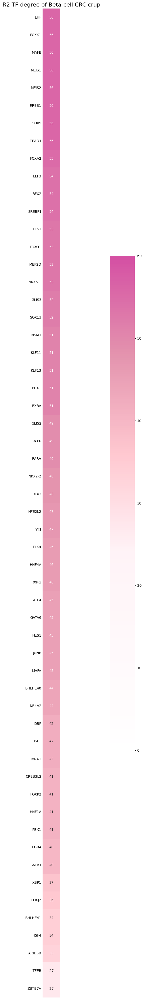

In [400]:
#title = 'TF degree of Beta-cell CRC recapitulation'
title = 'R2 TF degree of Beta-cell CRC crup'
degree_recap, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=60, figsize=(40,40))

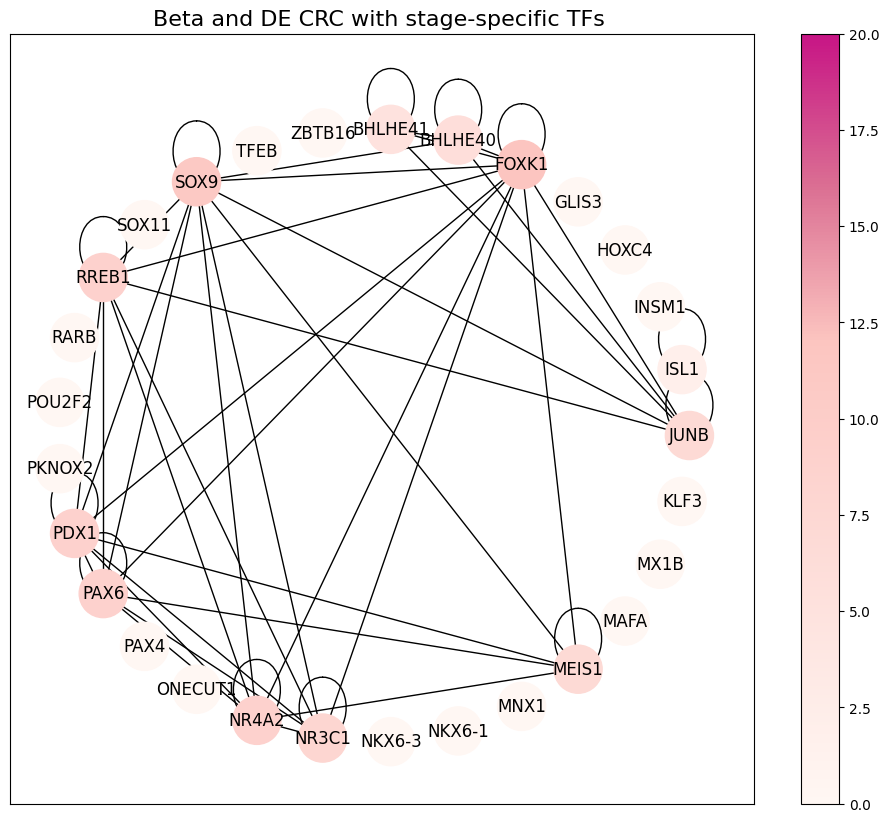

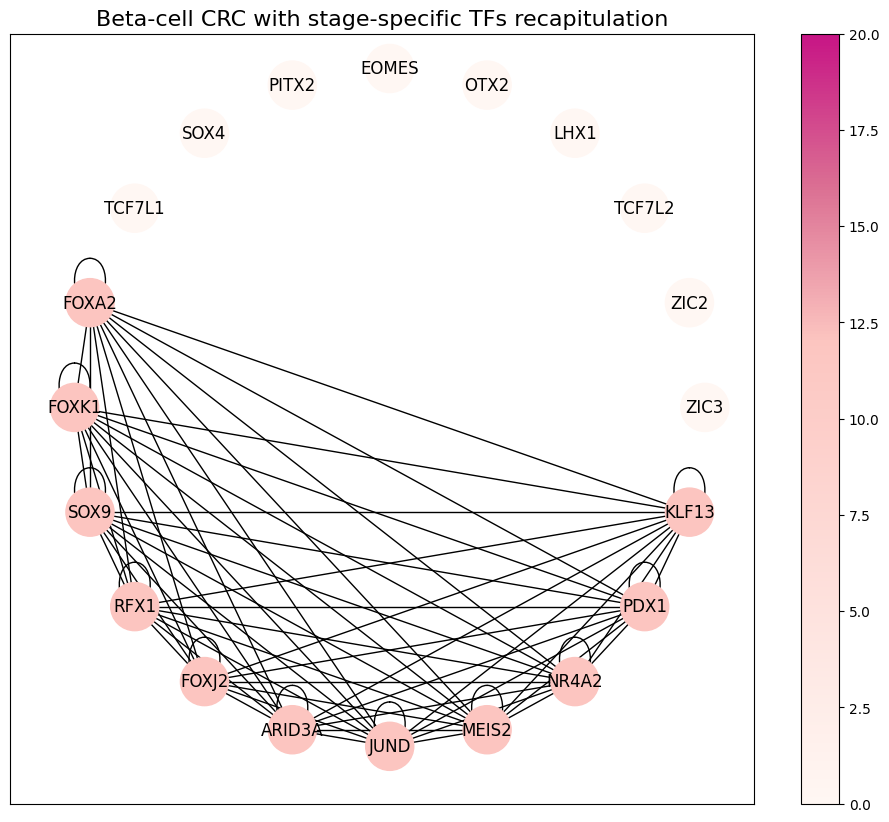

In [125]:
title = 'Beta-cell CRC with stage-specific TFs recapitulation'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap, vmax=20)

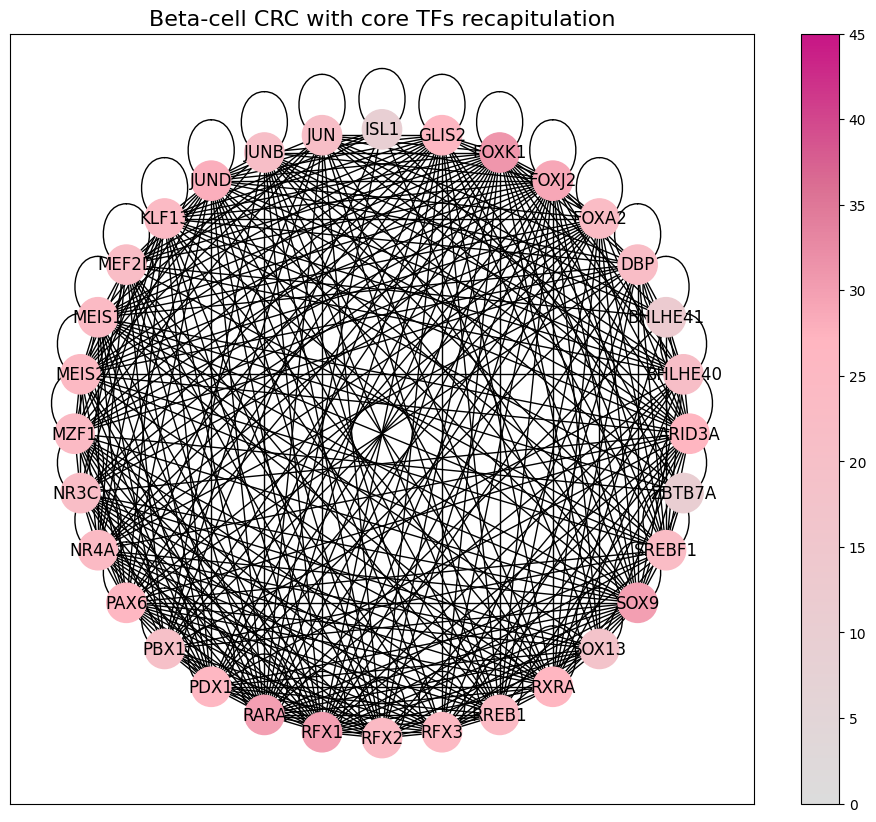

In [345]:
# DE CRC composed of all autoregulatory TFs
nodeList = sorted(degree['TF'].to_list())

edgeList = []
for pair in edgeCountDict.keys():
    edgeList.append(pair)

# constructing network
title = 'Beta-cell CRC with core TFs recapitulation'
plt.figure(figsize=(12,10), dpi=100)
plt.title(title, fontsize=16)
G = nx.Graph()
G.add_nodes_from(nodeList)
G.add_edges_from(edgeList)
pos = nx.circular_layout(G)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G, pos)
node_color = [G.degree(v) for v in G]
network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=mycmap, node_size=800, vmin=0, vmax=45)
plt.colorbar(network)
plt.savefig('./visualization/'+'_'.join(title.split())+'.pdf', dpi=100)
# plt.show()

In [133]:
degree_paper['rank'] = degree_paper.degree.rank(method="min", ascending=False)
print(degree_paper)

         TF  degree  rank
2     FOXA2      45   1.0
0     FOXK1      45   1.0
26    TEAD1      45   1.0
11    INSM1      44   4.0
5     MEIS2      44   4.0
4     RREB1      44   4.0
13    KLF13      43   7.0
3      MAFA      43   7.0
8     MEF2D      43   7.0
6      PDX1      43   7.0
15    SOX13      43   7.0
34      EHF      42  12.0
12     RFX2      42  12.0
18   ARID3A      41  14.0
17    FOXJ2      41  14.0
29    MEIS1      41  14.0
7      PAX6      41  14.0
14     RARA      41  14.0
9     SMAD3      41  14.0
10   NFE2L2      40  20.0
16   NKX2-2      40  20.0
20     RXRA      40  20.0
30     SOX9      40  20.0
28   SREBF1      40  20.0
36     RFX3      39  25.0
27    GLIS3      38  26.0
24     JUND      38  26.0
31   NKX6-1      38  26.0
32     PBX1      38  26.0
37  BHLHE40      36  30.0
21    GLIS2      36  30.0
25     MZF1      36  30.0
33    NR4A2      36  30.0
19    NR3C1      35  34.0
22     JUNB      34  35.0
40     MNX1      33  36.0
23    GATA6      32  37.0
39  CREB3L2 

In [439]:
degree_recap['rank'] = degree_recap.degree.rank(method="min", ascending=False)
print(degree_recap)

         TF  degree  rank
0     FOXK1      30   1.0
4      RARA      29   2.0
2      RFX1      29   2.0
1      SOX9      29   2.0
3     FOXJ2      28   5.0
6      JUND      27   6.0
9    ARID3A      26   7.0
20     RXRA      26   7.0
14    GLIS2      25   9.0
22     PAX6      25   9.0
12     PDX1      25   9.0
8     MEIS2      24  12.0
21     RFX3      24  12.0
7     KLF13      23  14.0
18    MEIS1      23  14.0
16     MZF1      23  14.0
11    NR4A2      23  14.0
19     RFX2      23  14.0
13    RREB1      23  14.0
10    FOXA2      22  20.0
23   SREBF1      22  20.0
15      DBP      21  22.0
28    MEF2D      21  22.0
26    NR3C1      21  22.0
5   BHLHE40      20  25.0
17      JUN      20  25.0
24     JUNB      20  25.0
27     PBX1      19  28.0
25    SOX13      17  29.0
31  BHLHE41      11  30.0
29   ZBTB7A       9  31.0
30     ISL1       8  32.0


In [441]:
pd.merge(degree_paper, degree_recap, on="TF", how="outer", suffixes=('_paper', '_recapitulation')).fillna('-')


,TF,degree_paper,rank_paper,degree_recapitulation,rank_recapitulation
0,FOXA2,45.0,1.0,22.0,20.0
1,FOXK1,45.0,1.0,30.0,1.0
2,TEAD1,45.0,1.0,-,-
3,INSM1,44.0,4.0,-,-
4,MEIS2,44.0,4.0,24.0,12.0
5,RREB1,44.0,4.0,23.0,14.0
6,KLF13,43.0,7.0,23.0,14.0
7,MAFA,43.0,7.0,-,-
8,MEF2D,43.0,7.0,21.0,22.0
9,PDX1,43.0,7.0,25.0,9.0


## degree heatmap of Beta cell (TRAP-SE)

In [451]:
betaCRC = pd.read_csv('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/Beta_CRC_SCORES_top4%.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
betaCRC.head(5)

,CRC_TFs,score,#TFs
0,"['MNT', 'RFX2']",5.304541,2
1,"['ZBTB7A', 'JUND', 'SREBF1', 'JUNB', 'NFIC', '...",4.953872,7
2,"['PBX1', 'RFX3', 'FOSB', 'JUNB', 'PAX6']",4.938709,5
3,"['PLAGL2', 'SREBF1', 'MAFA', 'SOX9']",4.933495,4
4,"['ZBTB7A', 'JUND', 'SREBF1', 'JUNB', 'FOSB', '...",4.931062,6


In [390]:
#betaAuto = parseTable('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/Beta_AUTOREG_top4%_mod.txt', '\t')
#betaEdges = parseTable('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/Beta_EDGES_top4%_mod.txt',  '\t')
#betaAuto = parseTable('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_AUTOREG_top4%.txt', '\t')
#betaEdges = parseTable('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_EDGES_top4%.txt',  '\t')


In [398]:
degree_TAD[100:]

,TF,degree
25,SOX13,42
118,ZNF213,42
47,ZNF394,42
112,MNX1,41
2,NKX2-2,41
117,CBFB,40
54,ZNF554,39
98,INSM1,37
40,MAZ,37
14,RFX3,36


top 5 TF: 
      TF  degree
32   EHF      35
36  PAX6      34
19  RARA      34
5   NFIC      33
18  MAFB      32


ValueError: The number of FixedLocator locations (0), usually from a call to set_ticks, does not match the number of ticklabels (11).

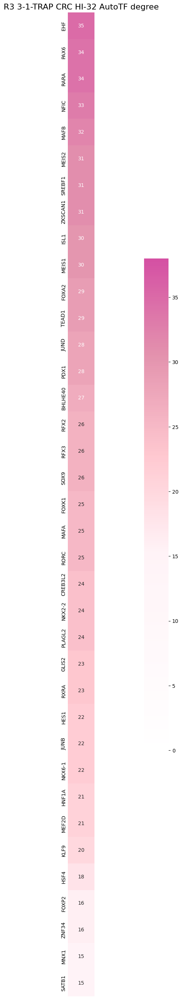

In [396]:
title = 'R3 3-1-TRAP CRC HI-32 AutoTF degree'
# degree_TAD, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=45)
degree_TAD = plotDegree2(edges=betaEdges, title = title, cmap = BetaDegreeCmap, vmax=38, figsize=(35,35))

first CRC is [['MNT', 'RFX2']]
top 5 TF: 
       TF  degree
9    PBX1      21
4  SREBF1      20
3    JUND      17
7    RARA      17
2  ZBTB7A      16


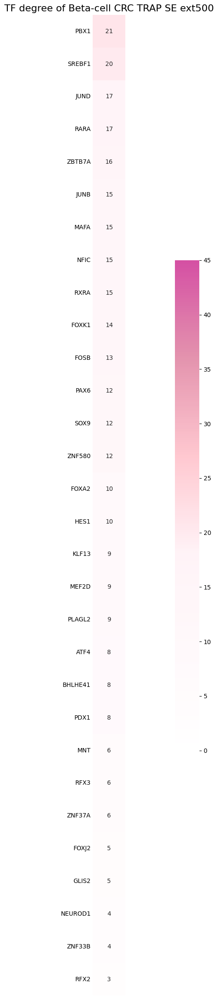

In [452]:
title = 'TF degree of Beta-cell CRC TRAP SE ext500'
degree_recap, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=45, figsize=(23,23))

## degree heatmap of Beta cell (TRAP-TAD)

In [271]:
betaAuto = parseTable('../CRCmapper/3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_AUTOREG_top1%.txt', '\t')
betaEdges = parseTable('../CRCmapper/3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_EDGES_top1%.txt',  '\t')

top 5 TF: 
         TF  degree
19   SREBF1     107
111   ESRRA      96
11    FOXK1      95
81    FOXO1      92
97     MAFG      92


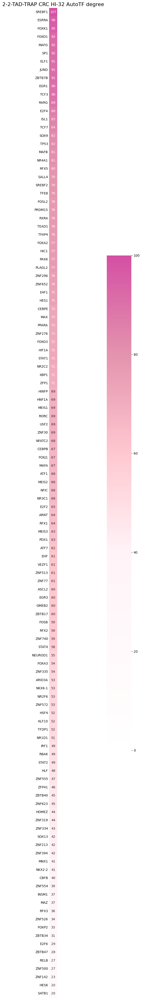

In [273]:
title = '2-2-TAD-TRAP CRC HI-32 AutoTF degree'
# degree_TAD, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=45)
degree_TAD = plotDegree2(edges=betaEdges, title = title, cmap = BetaDegreeCmap, vmax=100, figsize=(43,43))

In [329]:
# betaCRC = pd.read_csv('./CRCmapper/2-2-TAD.crc_Beta_narrow.05_broad.1_incltss_cutoff500/Beta_CRC_SCORES.txt', 
                      # header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
# betaCRC.head(5)
betaAuto = parseTable('../CRCmapper/2-2-TAD-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/Beta_AUTOREG_top0.5%.txt', '\t')
betaEdges = parseTable('../CRCmapper/2-2-TAD-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/Beta_EDGES_top0.5%.txt',  '\t')

top 5 TF: 
        TF  degree
2     MAFG      39
34  SREBF1      39
49   ESRRA      38
21   FOXK1      35
48   STAT3      31


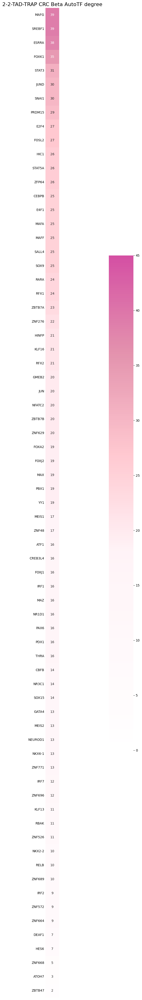

In [391]:
title = '2-2-TAD-TRAP CRC Beta AutoTF degree'
# degree_TAD, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=45)
degree_TAD = plotDegree2(edges=betaEdges, title = title, cmap = BetaDegreeCmap, vmax=45, figsize=(43,43))

In [334]:
degree_TAD['rank'] = degree_TAD.degree.rank(method="min", ascending=False)

In [144]:
pd.merge(degree_paper, degree_TAD, on="TF", how="outer", suffixes=('_paper', '_TAD')).fillna('-').to_csv("./CRCmapper/2-2-TAD.crc_Beta_narrow.05_broad.1_incltss_cutoff500/table.txt", sep="\t")

## degree heatmap of Beta cell (HI-32_H3K27ac)

In [528]:
# HI32_CRC = pd.read_csv('../TRAP/Beta_narrow.05_broad.1_incltss_cutoff500_ext0_TAD/CRC_SCORES_autoCutoff.01_p.05_ext0.txt', 
                      # header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
macs_CRC = pd.read_csv('../CRCmapper/2-1.crc_macs2_HI-32_K27ac_narrow.05_broad.05_incltss_cutoffSE_ext500/H3K27ac_HI-32_CRC_SCORES.txt', 
                       header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
macs_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY...",3460.250000,20
1,"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY...",3457.476190,21
2,"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY...",3451.500000,12
3,"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY...",3450.500000,20
4,"['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'FO...",3436.272727,11


first CRC is [['SOX9', 'FOXA2', 'FOXO1', 'STAT1', 'EHF', 'YY1', 'ELF3', 'FOXK1', 'TEF', 'TEAD1', 'STAT3', 'SP1', 'MAFB', 'MEIS2', 'RFX1', 'KLF11', 'NFATC4', 'PDX1', 'FOXJ2', 'ETS1']]
top 5 TF: 
      TF  degree
0   SOX9      65
1  FOXA2      64
2  FOXO1      63
4    EHF      62
3  STAT1      62


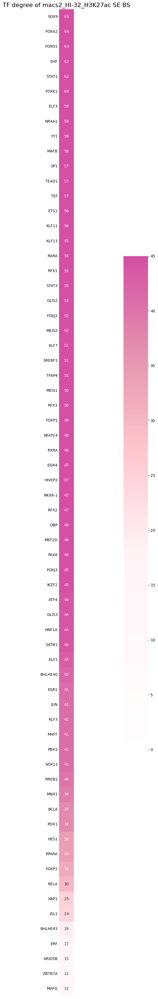

In [533]:
title = 'TF degree of macs2_HI-32_H3K27ac SE BS'
degree_HI32, edgeCountDict = plotDegree(CRC = macs_CRC, cmap = BetaDegreeCmap, title=title, vmax=45, figsize=(37, 37))

In [534]:
# HI32_CRC = pd.read_csv('../TRAP/Beta_narrow.05_broad.1_incltss_cutoff500_ext0_TAD/CRC_SCORES_autoCutoff.01_p.05_ext0.txt', 
                      # header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC = pd.read_csv('../CRCmapper/1-1.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext500/H3K27ac_HI-32_CRC_SCORES.txt', 
                       header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RF...",1005.086957,28
1,"['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RF...",1004.071429,23
2,"['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RF...",1000.481481,27
3,"['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RF...",999.518519,27
4,"['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RF...",998.777778,27


first CRC is [['SOX9', 'MEIS1', 'RREB1', 'MEIS2', 'EHF', 'RFX2', 'TEAD1', 'FOXA2', 'FOXK1', 'MEF2D', 'TEF', 'MAFB', 'INSM1', 'NKX6-1', 'GLIS3', 'ARID5B', 'ETS1', 'RXRG', 'FOXO1', 'PAX6', 'NKX2-2', 'PDX1', 'KLF13', 'CREB3L2', 'SREBF1', 'MNX1', 'PBX1', 'GATA6']]
top 5 TF: 
      TF  degree
4    EHF      62
7  FOXA2      62
1  MEIS1      62
3  MEIS2      62
5   RFX2      62


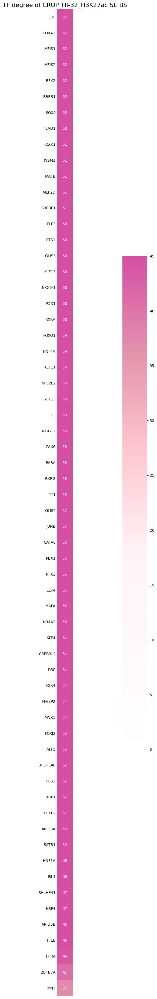

In [535]:
title = 'TF degree of CRUP_HI-32_H3K27ac SE BS'
degree_HI32, edgeCountDict = plotDegree(CRC = HI32_CRC, cmap = BetaDegreeCmap, title=title, vmax=45, figsize=(37, 37))

In [424]:
HI32_CRC = pd.read_csv('../CRCmapper/1-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext0/CRUP_HI-32_K27ac_CRC_SCORES.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['NFIC', 'EHF', 'ETS1', 'MEIS1', 'TEAD1', 'SOX...",12324.000000,23
1,"['NFIC', 'EHF', 'ETS1', 'MEIS1', 'TEAD1', 'ZNF...",12314.333333,21
2,"['NFIC', 'FOXK1', 'SREBF1', 'RFX2', 'MAFB', 'M...",12308.380952,21
3,"['NFIC', 'EHF', 'ETS1', 'MEIS1', 'TEAD1', 'SOX...",12300.434783,23
4,"['NFIC', 'EHF', 'ETS1', 'MEIS1', 'TEAD1', 'ZNF...",12285.238095,21


first CRC is [['NFIC', 'EHF', 'ETS1', 'MEIS1', 'TEAD1', 'SOX9', 'PAX6', 'RFX2', 'FOXO1', 'ZKSCAN1', 'SREBF1', 'MEIS2', 'ELF3', 'SOX13', 'NKX2-2', 'ZNF34', 'GLIS3', 'ISL1', 'MAFB', 'RREB1', 'FOXA2', 'MEF2D', 'PDX1']]
top 5 TF: 
      TF  degree
0   NFIC      68
1    EHF      67
2   ETS1      66
6   PAX6      66
4  TEAD1      66


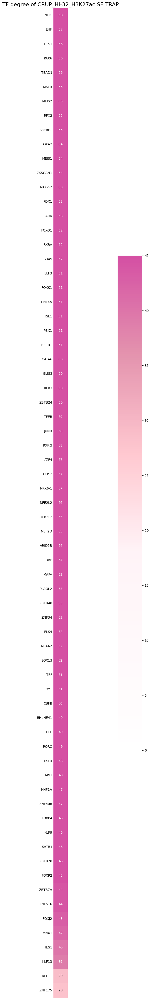

In [427]:
title = 'TF degree of CRUP_HI-32_H3K27ac SE TRAP'
degree_HI32, edgeCountDict = plotDegree(CRC = HI32_CRC, cmap = BetaDegreeCmap, title=title, vmax=45, figsize=(42, 25))

In [453]:
'''HI32_CRC = pd.read_csv('../CRCmapper/1-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext0/CRUP_HI-32_K27ac_CRC_SCORES_', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC.head(5)'''

FileNotFoundError: [Errno 2] No such file or directory: '../CRCmapper/1-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext0/CRUP_HI-32_K27ac_CRC_SCORES.txt'

In [454]:
HI32_CRC = pd.read_csv('../CRCmapper/3-1.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext500/H3K27ac_HI-32_CRC_SCORES.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['MAFB', 'RREB1', 'FOXA2', 'TEAD1', 'TFEB', 'R...",109.076923,13
1,"['MAFB', 'RREB1', 'FOXA2', 'TEAD1', 'TFEB', 'R...",108.076923,13
2,"['MAFB', 'RREB1', 'FOXA2', 'TEAD1', 'MEIS2', '...",107.312500,16
3,"['MAFB', 'RREB1', 'FOXA2', 'TEAD1', 'MEIS2', '...",107.235294,17
4,"['MAFB', 'RREB1', 'FOXA2', 'TEAD1', 'MEIS2', '...",107.117647,17


first CRC is [['MAFB', 'MEIS2', 'RREB1', 'FOXA2', 'FOXK1', 'TEAD1', 'JUNB', 'SREBF1', 'PDX1', 'RARA', 'ELF3', 'EHF', 'MEIS1', 'RFX2']]
top 5 TF: 
       TF  degree
0    MAFB      33
1   MEIS2      33
2   RREB1      32
11    EHF      31
3   FOXA2      31


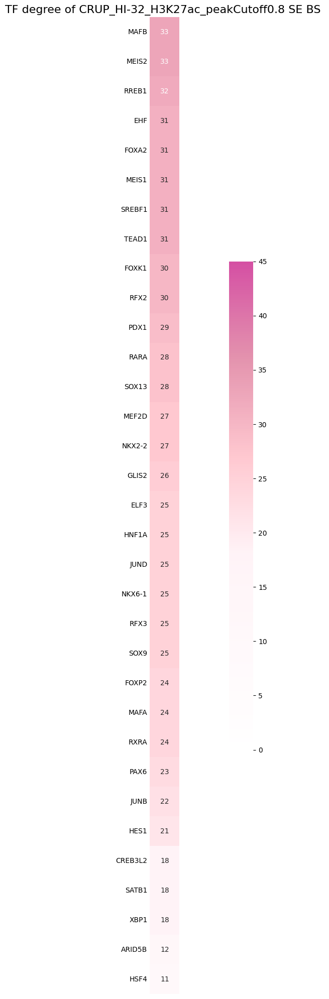

In [423]:
title = 'TF degree of CRUP_HI-32_H3K27ac_peakCutoff0.8 SE BS '
degree_HI32, edgeCountDict = plotDegree(CRC = HI32_CRC, cmap = BetaDegreeCmap, title=title, vmax=45, figsize=(20,20))

In [435]:
HI32_CRC = pd.read_csv('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_CRC_SCORES_top4%.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['EHF', 'PAX6', 'NKX6-1', 'FOXA2', 'MEIS2', 'N...",5.708662,10
1,"['EHF', 'PAX6', 'NKX6-1', 'FOXA2', 'MEIS2', 'N...",5.707895,11
2,"['EHF', 'NFIC', 'NKX6-1', 'FOXA2', 'MEIS2', 'N...",5.673365,11
3,"['EHF', 'NFIC', 'HNF1A', 'MAFB', 'FOXK1', 'ZKS...",5.642290,8
4,"['EHF', 'PAX6', 'RARA', 'SOX9', 'MAFB', 'MEIS1...",5.635612,10


top 5 TF: 
      TF  degree
32   EHF      35
36  PAX6      34
19  RARA      34
5   NFIC      33
18  MAFB      32


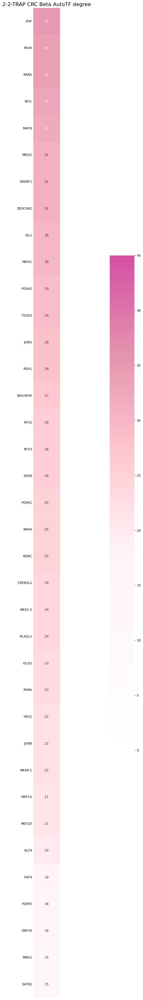

In [61]:
betaAuto = parseTable('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_AUTOREG_top4%.txt', '\t')
betaEdges = parseTable('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_EDGES_top4%.txt',  '\t')
title = '2-2-TRAP CRC Beta AutoTF degree'
# degree_TAD, edgeCountDict = plotDegree(CRC = betaCRC, title = title, cmap = BetaDegreeCmap, vmax=45)
degree_TAD = plotDegree2(edges=betaEdges, title = title, cmap = BetaDegreeCmap, vmax=45, figsize=(43,43))

first CRC is [['EHF', 'PAX6', 'NKX6-1', 'FOXA2', 'MEIS2', 'NKX2-2', 'PDX1', 'MEIS1', 'MAFB', 'RFX3']]
top 5 TF: 
      TF  degree
0    EHF      35
1   PAX6      34
16  RARA      34
12  NFIC      33
8   MAFB      32


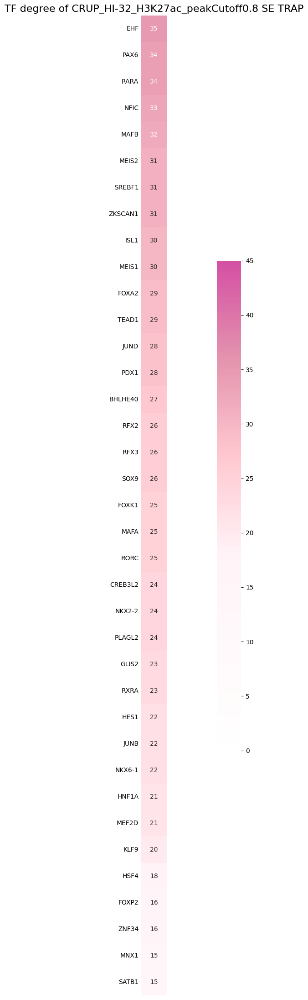

In [436]:
title = 'TF degree of CRUP_HI-32_H3K27ac_peakCutoff0.8 SE TRAP'
degree_HI32, edgeCountDict = plotDegree(CRC = HI32_CRC, cmap = BetaDegreeCmap, title=title, vmax=45, figsize=(22,22))

In [438]:
betaEdges = parseTable('../CRCmapper/3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_EDGES_top1%.txt',  '\t')

top 5 TF: 
         TF  degree
19   SREBF1     107
111   ESRRA      96
11    FOXK1      95
81    FOXO1      92
97     MAFG      92


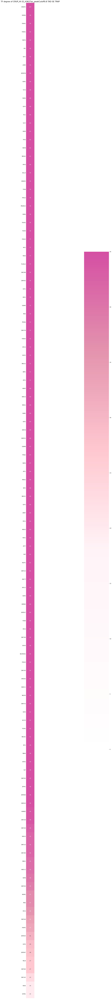

In [439]:
title = 'TF degree of CRUP_HI-32_H3K27ac_peakCutoff0.8 TAD SE TRAP'
degree_TAD = plotDegree2(edges=betaEdges, title = title, cmap = BetaDegreeCmap, vmax=45, figsize=(120,120))

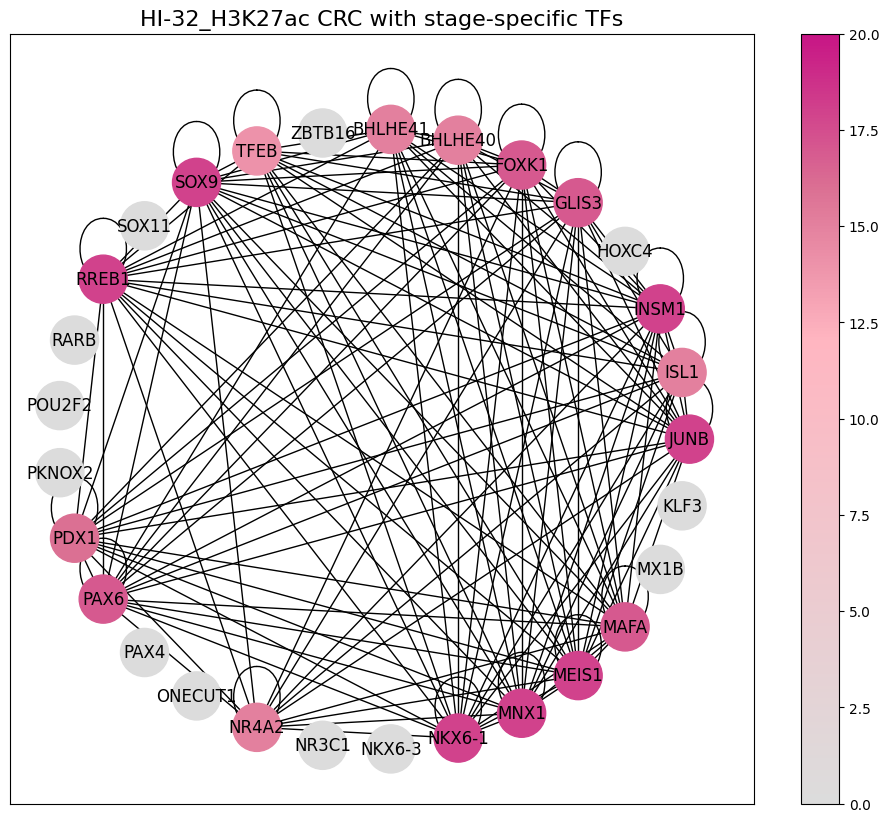

In [348]:
title = 'HI-32_H3K27ac CRC with stage-specific TFs'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap, vmax=20)

## degree heatmap of Beta cell (HI-32_H3K27ac_cutoff500)

In [349]:
HI32_cutoff500_CRC = pd.read_csv('./CRCmapper/1-1.crc_HI-32_K27ac_incltss_cutoff500/H3K27ac_HI-32_CRC_SCORES.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
HI32_cutoff500_CRC.head(5)

,CRC_TFs,score,#TFs
0,"['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', '...",78.666667,18
1,"['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', '...",78.631579,19
2,"['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', '...",78.555556,18
3,"['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', '...",78.210526,19
4,"['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', '...",78.111111,18


first CRC is [['FOXK1', 'MEIS1', 'MAFB', 'TEAD1', 'RREB1', 'KLF11', 'MEIS2', 'FOXA2', 'EHF', 'RFX2', 'SREBF1', 'ISL1', 'NKX6-1', 'KLF13', 'TFEB', 'PBX1', 'MEF2D', 'ARID5B']]
top 5 TF: 
      TF  degree
8    EHF      34
7  FOXA2      34
0  FOXK1      34
5  KLF11      34
2   MAFB      34


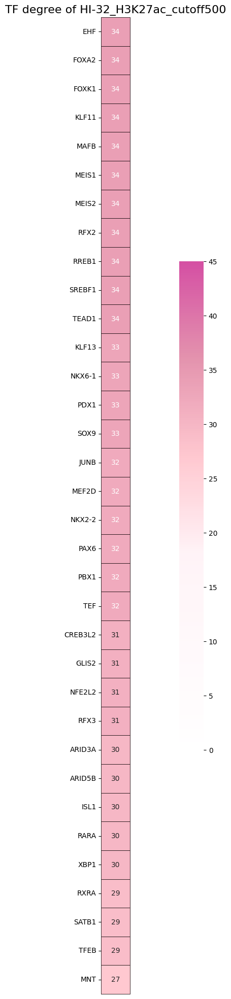

In [350]:
title = 'TF degree of HI-32_H3K27ac_cutoff500'
degree, edgeCountDict = plotDegree(CRC = HI32_cutoff500_CRC, cmap = BetaDegreeCmap, title=title, vmax=45)

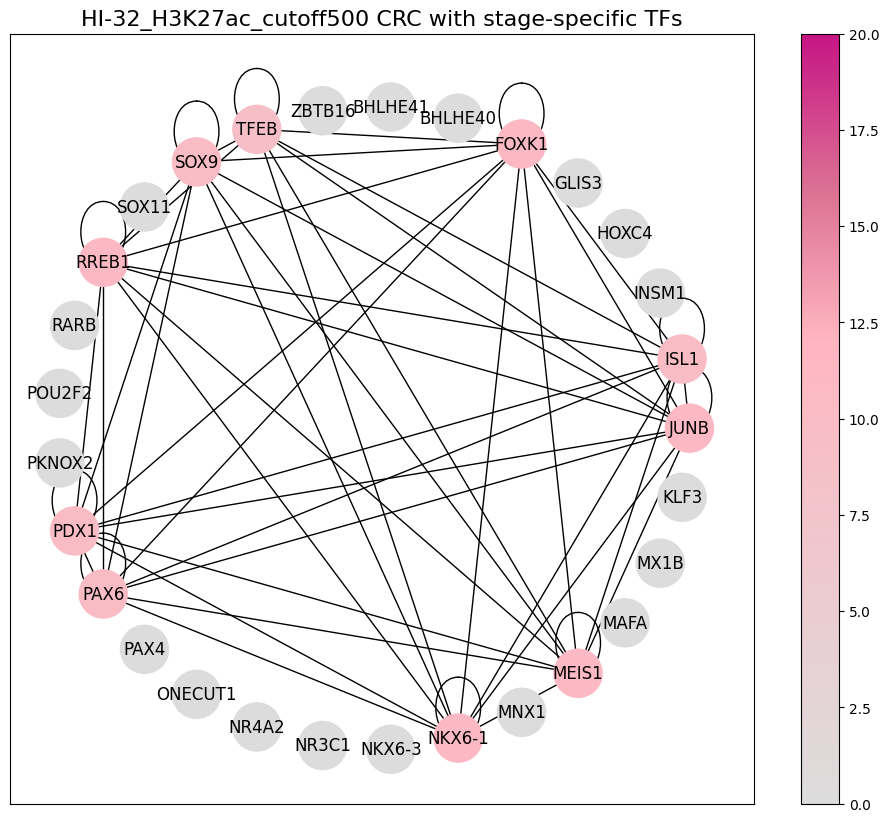

In [351]:
title = 'HI-32_H3K27ac_cutoff500 CRC with stage-specific TFs'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap, vmax=20)

In [22]:
degree_HI32['rank'] = degree_HI32.degree.rank(method="min", ascending=False)
display(degree_HI32)

,TF,degree,rank
4,EHF,62,1.0
7,FOXA2,62,1.0
1,MEIS1,62,1.0
3,MEIS2,62,1.0
5,RFX2,62,1.0
...,...,...,...
25,ARID5B,46,58.0
14,TFEB,46,58.0
52,THRA,44,60.0
61,ZBTB7A,41,61.0


In [450]:
pd.merge(degree_paper, degree_HI32, on="TF", how="outer", suffixes=('_paper', '_HI32')).fillna('-')[:35]


,TF,degree_paper,rank_paper,degree_HI32,rank_HI32
0,FOXA2,45.0,1.0,62.0,1.0
1,FOXK1,45.0,1.0,61.0,9.0
2,TEAD1,45.0,1.0,62.0,1.0
3,INSM1,44.0,4.0,61.0,9.0
4,MEIS2,44.0,4.0,62.0,1.0
5,RREB1,44.0,4.0,62.0,1.0
6,KLF13,43.0,7.0,60.0,14.0
7,MAFA,43.0,7.0,55.0,37.0
8,MEF2D,43.0,7.0,61.0,9.0
9,PDX1,43.0,7.0,60.0,14.0


In [451]:
pd.merge(degree_paper, degree_HI32, on="TF", how="outer", suffixes=('_paper', '_HI32')).fillna('-')[35:]

,TF,degree_paper,rank_paper,degree_HI32,rank_HI32
35,MNX1,33.0,36.0,54.0,40.0
36,GATA6,32.0,37.0,56.0,34.0
37,CREB3L2,31.0,38.0,54.0,40.0
38,HES1,31.0,38.0,52.0,47.0
39,KLF3,31.0,38.0,-,-
40,KLF7,30.0,41.0,-,-
41,ISL1,27.0,42.0,48.0,54.0
42,JUN,26.0,43.0,-,-
43,BHLHE41,23.0,44.0,47.0,56.0
44,ZBTB7A,17.0,45.0,41.0,61.0


## degree heatmap of DE (paper)

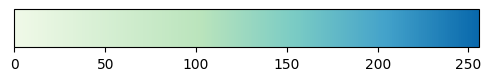

In [96]:
#colors = ['white', 'wheat', 'xkcd:maize', 'xkcd:sunflower', 'xkcd:squash']
colors = ['#f0f9e8','#bae4bc','#7bccc4','#43a2ca','#0868ac']
nodes = [0, 0.4, 0.6, 0.8, 1]
deDegreeCmap = mcolors.LinearSegmentedColormap.from_list('cmap1', list(zip(nodes, colors)))
show_cmap(deDegreeCmap)

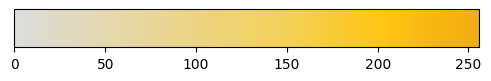

In [14]:
colors = ['gainsboro', 'xkcd:maize', 'xkcd:sunflower', 'xkcd:squash']
nodes = [0, 0.6, 0.8, 1]
deCRCcmap = mcolors.LinearSegmentedColormap.from_list('cmap1', list(zip(nodes, colors)))
show_cmap(deCRCcmap)

In [338]:
wb = pd.ExcelFile('/home/jieyidi/Downloads/Meissner2019/1-s2.0-S1934590919304667-mmc7_CRC.xlsx')
wb.sheet_names

['hPSC', 'DE', 'PP1', 'PP2', 'EN', 'SC-beta', 'PH', 'Alpha', 'Beta']

In [339]:
deCRCinPaper = wb.parse('DE')
deCRCinPaper.head(5)

,CRC#,CRC_TFs,score,#TFs
0,1,"['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SO...",48.076923,13
1,2,"['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SO...",47.692308,13
2,3,"['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SO...",47.461538,13
3,4,"['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SO...",47.076923,13
4,5,"['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SO...",46.800000,15


first CRC is [['ZIC3', 'FOXA2', 'YY1', 'KLF7', 'TCF7L2', 'SOX4', 'EOMES', 'OTX2', 'FOXO3', 'TCF7L1', 'SOX17', 'JUND', 'ZIC2']]
top 5 TF: 
       TF  degree
0    ZIC3      28
1   FOXA2      27
4  TCF7L2      27
3    KLF7      26
7    OTX2      26


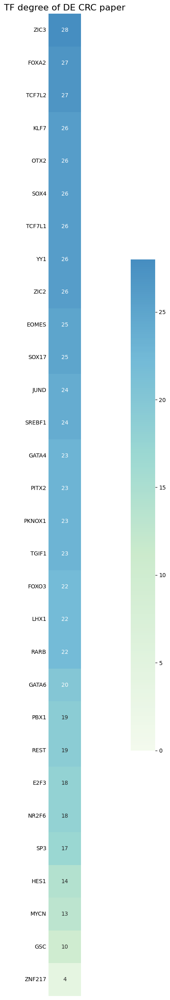

In [341]:
title = 'TF degree of DE CRC paper'
degree_paper, edgeCountDict = plotDegree(CRC = deCRCinPaper, title = title, cmap = deDegreeCmap, vmax=28)

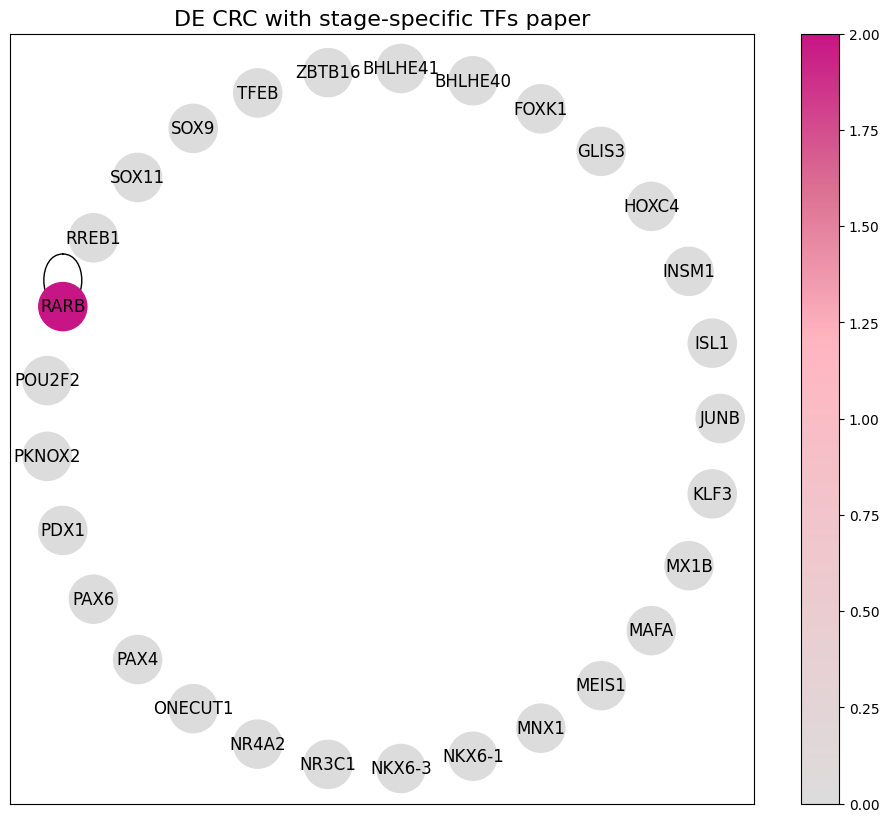

In [356]:
title = 'DE CRC with stage-specific TFs paper'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap)

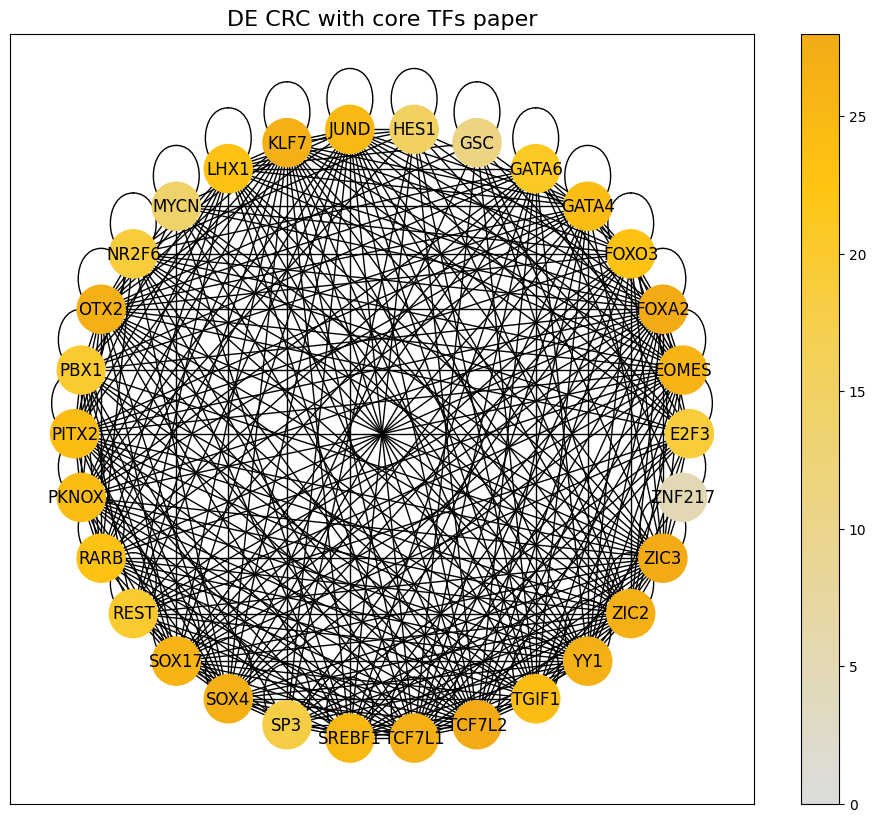

In [360]:
# DE CRC composed of all autoregulatory TFs
nodeList = sorted(degree['TF'].to_list())

edgeList = []
for pair in edgeCountDict.keys():
    edgeList.append(pair)

# constructing network
title = 'DE CRC with core TFs paper'
plt.figure(figsize=(12,10), dpi=100)
plt.title(title, fontsize=16)
G = nx.Graph()
G.add_nodes_from(nodeList)
G.add_edges_from(edgeList)
pos = nx.circular_layout(G)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G, pos)
node_color = [G.degree(v) for v in G]
network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=deCRCcmap, node_size=1200, vmin=0, vmax=28)
plt.colorbar(network)
plt.savefig('./visualization/'+'_'.join(title.split())+'.pdf', dpi=100)

## degree heatmap of DE (racapitulation)

In [99]:
deCRC = pd.read_csv('../CRCmapper/6-1.crc_DE_narrow.05_broad.05_exclNMtss_cutoffSE_ext500/DE_H3K27ac_CRC_SCORES.txt', 
                      header = None, sep = '\t', names = ['CRC_TFs', 'score', '#TFs'])
deCRC.head(5)

,CRC_TFs,score,#TFs
0,"['ZIC3', 'ZIC2', 'TCF7L2', 'LHX1', 'OTX2', 'EO...",29.500000,10
1,"['ZIC3', 'ZIC2', 'TCF7L2', 'LHX1', 'OTX2', 'EO...",28.000000,11
2,"['ZIC3', 'ZIC2', 'TCF7L2', 'KLF7', 'RARB', 'OT...",27.833333,12
3,"['GATA4', 'FOXA2', 'TCF7L2', 'ZIC2', 'OTX2', '...",27.777778,9
4,"['ZIC3', 'ZIC2', 'TCF7L2', 'SALL2', 'OTX2', 'E...",27.750000,8


first CRC is [['ZIC3', 'ZIC2', 'TCF7L2', 'LHX1', 'OTX2', 'EOMES', 'PITX2', 'SOX4', 'TCF7L1', 'FOXA2']]
top 5 TF: 
       TF  degree
0    ZIC3      26
1    ZIC2      25
2  TCF7L2      24
9   FOXA2      23
4    OTX2      23


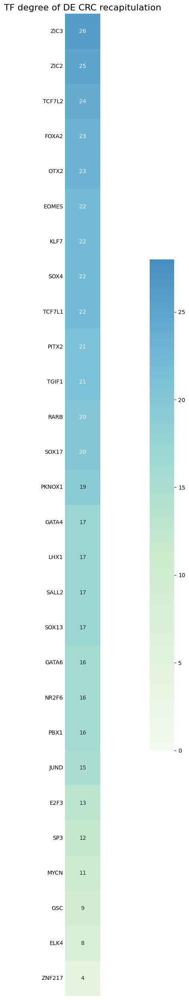

In [126]:
title = 'TF degree of DE CRC recapitulation'
degree_recap, edgeCountDict = plotDegree(CRC = deCRC, title = title, cmap = deDegreeCmap, vmax=28)

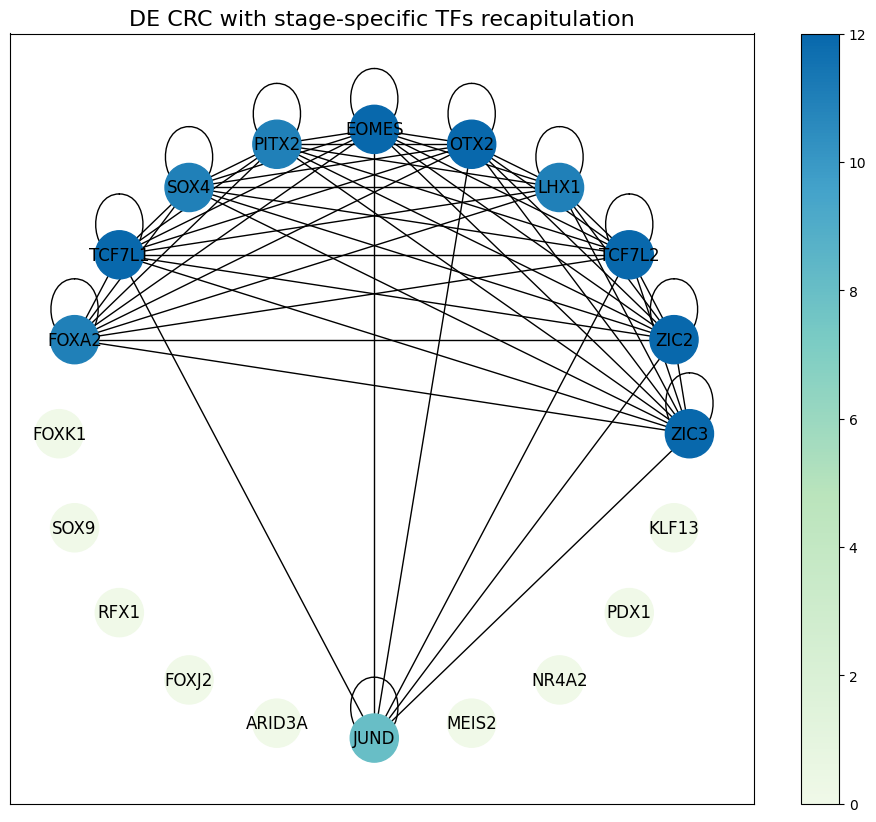

In [128]:
title = 'DE CRC with stage-specific TFs recapitulation'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=deDegreeCmap)

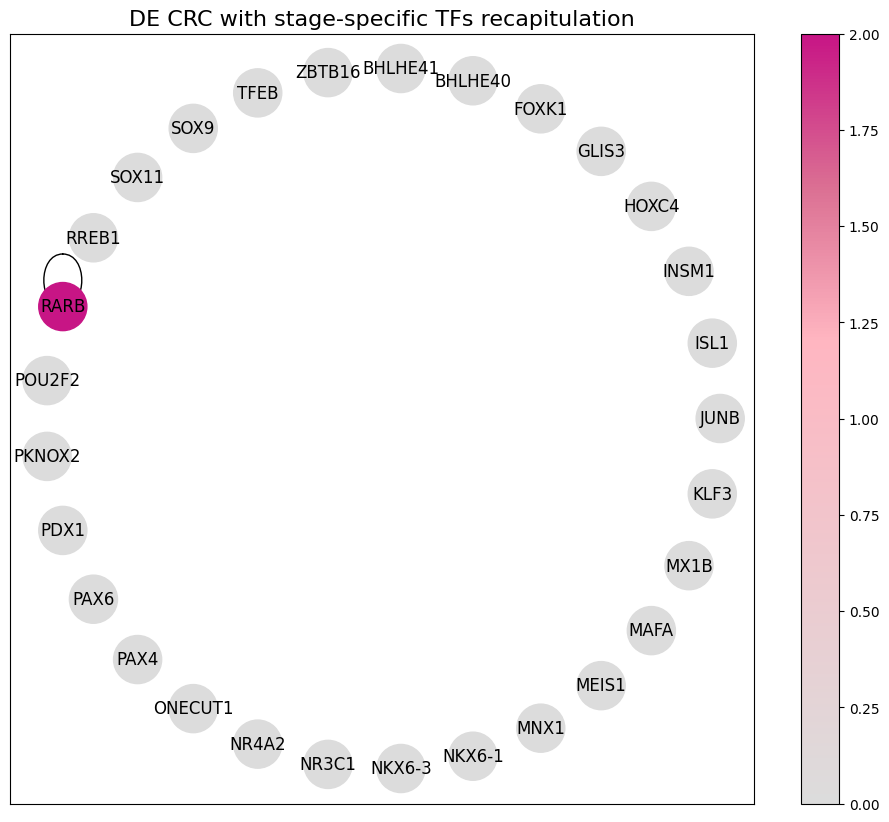

In [363]:
title = 'DE CRC with stage-specific TFs recapitulation'
plotNetwork(edgeCountDict=edgeCountDict, title=title, cmap=BetaCRCcmap)

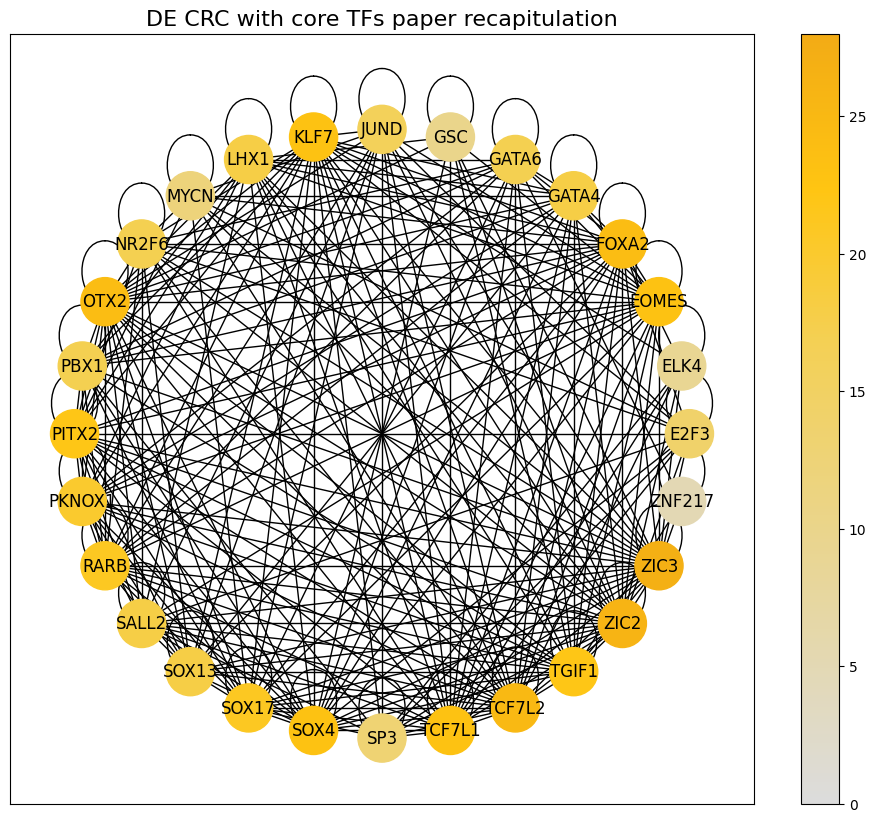

In [364]:
# DE CRC composed of all autoregulatory TFs
nodeList = sorted(degree['TF'].to_list())

edgeList = []
for pair in edgeCountDict.keys():
    edgeList.append(pair)

# constructing network
title = 'DE CRC with core TFs paper recapitulation'
plt.figure(figsize=(12,10), dpi=100)
plt.title(title, fontsize=16)
G = nx.Graph()
G.add_nodes_from(nodeList)
G.add_edges_from(edgeList)
pos = nx.circular_layout(G)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G, pos)
node_color = [G.degree(v) for v in G]
network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=deCRCcmap, node_size=1200, vmin=0, vmax=28)
plt.colorbar(network)
plt.savefig('./visualization/'+'_'.join(title.split())+'.pdf', dpi=100)

In [21]:
degree_paper['rank'] = degree_paper.degree.rank(method="min", ascending=False)
print(degree_paper)

        TF  degree  rank
0     ZIC3      28   1.0
1    FOXA2      27   2.0
4   TCF7L2      27   2.0
3     KLF7      26   4.0
7     OTX2      26   4.0
5     SOX4      26   4.0
9   TCF7L1      26   4.0
2      YY1      26   4.0
12    ZIC2      26   4.0
6    EOMES      25  10.0
10   SOX17      25  10.0
11    JUND      24  12.0
17  SREBF1      24  12.0
14   GATA4      23  14.0
13   PITX2      23  14.0
16  PKNOX1      23  14.0
24   TGIF1      23  14.0
8    FOXO3      22  18.0
18    LHX1      22  18.0
15    RARB      22  18.0
22   GATA6      20  21.0
20    PBX1      19  22.0
19    REST      19  22.0
25    E2F3      18  24.0
21   NR2F6      18  24.0
23     SP3      17  26.0
28    HES1      14  27.0
26    MYCN      13  28.0
27     GSC      10  29.0
29  ZNF217       4  30.0


In [408]:
degree_recap['rank'] = degree_recap.degree.rank(method="min", ascending=False)
print(degree_recap)

        TF  degree  rank
0     ZIC3      26   1.0
1     ZIC2      25   2.0
2   TCF7L2      24   3.0
9    FOXA2      23   4.0
4     OTX2      23   4.0
5    EOMES      22   6.0
12    KLF7      22   6.0
7     SOX4      22   6.0
8   TCF7L1      22   6.0
6    PITX2      21  10.0
11   TGIF1      21  10.0
13    RARB      20  12.0
14   SOX17      20  12.0
10  PKNOX1      19  14.0
15   GATA4      17  15.0
3     LHX1      17  15.0
16   SALL2      17  15.0
23   SOX13      17  15.0
24   GATA6      16  19.0
18   NR2F6      16  19.0
25    PBX1      16  19.0
17    JUND      15  22.0
21    E2F3      13  23.0
26     SP3      12  24.0
20    MYCN      11  25.0
22     GSC       9  26.0
19    ELK4       8  27.0
27  ZNF217       4  28.0


In [410]:
pd.merge(degree, degree_recap, on="TF", how="outer", suffixes=('_paper', '_recapitulation')).fillna('-')

,TF,degree_paper,rank_paper,degree_recapitulation,rank_recapitulation
0,ZIC3,28.0,1.0,26.0,1.0
1,FOXA2,27.0,2.0,23.0,4.0
2,TCF7L2,27.0,2.0,24.0,3.0
3,KLF7,26.0,4.0,22.0,6.0
4,OTX2,26.0,4.0,23.0,4.0
5,SOX4,26.0,4.0,22.0,6.0
6,TCF7L1,26.0,4.0,22.0,6.0
7,YY1,26.0,4.0,-,-
8,ZIC2,26.0,4.0,25.0,2.0
9,EOMES,25.0,10.0,22.0,6.0


In [25]:
print(pd.merge(degree_paper, degree_HI32, on="TF", how="outer", suffixes=('_DE', '_HI32')).fillna('-').to_string())

         TF degree_DE rank_DE degree_HI32 rank_HI32
0      ZIC3      28.0     1.0           -         -
1     FOXA2      27.0     2.0        62.0       1.0
2    TCF7L2      27.0     2.0           -         -
3      KLF7      26.0     4.0           -         -
4      OTX2      26.0     4.0           -         -
5      SOX4      26.0     4.0           -         -
6    TCF7L1      26.0     4.0           -         -
7       YY1      26.0     4.0        58.0      27.0
8      ZIC2      26.0     4.0           -         -
9     EOMES      25.0    10.0           -         -
10    SOX17      25.0    10.0           -         -
11     JUND      24.0    12.0           -         -
12   SREBF1      24.0    12.0        61.0       9.0
13    GATA4      23.0    14.0           -         -
14    PITX2      23.0    14.0           -         -
15   PKNOX1      23.0    14.0           -         -
16    TGIF1      23.0    14.0           -         -
17    FOXO3      22.0    18.0           -         -
18     LHX1 

## <u>each step of function plotDegree</u>

In [69]:
cliqueList = []
for i in betaCRCinPaper['CRC_TFs']:
    cliqueList.append(eval(i))
print(cliqueList[0])

['FOXK1', 'HES1', 'FOXA2', 'MAFA', 'RREB1', 'MEIS2', 'PDX1', 'PAX6', 'MEF2D', 'SMAD3', 'NFE2L2', 'INSM1', 'RFX2', 'KLF13', 'RARA', 'SOX13', 'NKX2-2']


In [29]:
# calculating degree for each node (TF) in the CRC
## degree of undirected graph
## including the degree of self-loop
## reason why using dict rather list: query speed of dictionary >> list

### 1. counting edges
edgeCountDict = {}
for clique in cliqueList:
    for TF in clique:
        for (source, target) in zip([TF] * len(clique), clique):
        # this for loop generate interactions (source, target) in each clique
            if (source, target) not in edgeCountDict.keys():
                edgeCountDict[(source, target)] = 0
            else:
                edgeCountDict[(source, target)] += 1
                
### 2. counting the occurrences of source nodes among edges => degree of nodes
degreeDict = {}
for (source, target) in edgeCountDict.keys():
    if source not in degreeDict.keys():
        degreeDict[source] = 1
    else:
        degreeDict[source] += 1

dict(list(degreeDict.items())[0:5])

{'FOXK1': 45, 'HES1': 31, 'FOXA2': 45, 'MAFA': 43, 'RREB1': 44}

In [30]:
# into sorted df
degree = pd.DataFrame(degreeDict.items(), columns=['TF','degree'])
# degree = pd.DataFrame.from_dict(degreeDict, orient='index')
degree.sort_values(by=['degree', 'TF'], ascending=[False, True], inplace=True)
degree.head(5)

,TF,degree
2,FOXA2,45
0,FOXK1,45
26,TEAD1,45
11,INSM1,44
5,MEIS2,44


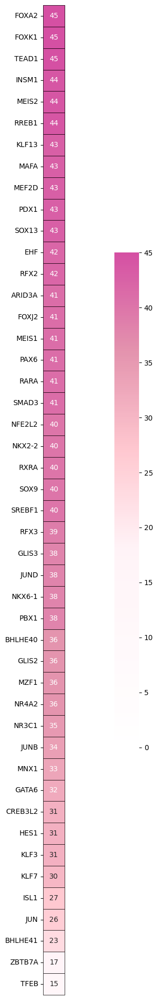

In [62]:
# degree heatmap
plt.figure(figsize=(25,25), dpi=100)
cbar_kws = {'shrink':0.5,}
kwargs = {'alpha':.75, 'linewidths':0.5, 'linecolor':'k', 'cmap': mycmap, 'vmin': 0, 'vmax': 45,
          'clip_on':False, 'annot': True, 'fmt':'g', 'square': True, 'xticklabels': False,
          'yticklabels': degree['TF'].to_list(),
          'cbar_kws': cbar_kws}
# sns.heatmap([degree['degree'].to_list()], **kwargs)
sns.heatmap(np.array([degree['degree'].to_list()]).T, **kwargs)
plt.yticks(rotation=0)
plt.savefig('./visualization/degree_Beta_paper.pdf', dpi=100)
# plt.show()

In [ ]:
# don't run
# calculating CRC scores
## 1. counting the occurences of the TFs accross the loops
dicoTFinloopsCounts={}
for clique in cliqueList:
    for TF in clique:
        if dicoTFinloopsCounts.__contains__(TF):
            dicoTFinloopsCounts[TF] += 1
        else:
            dicoTFinloopsCounts[TF] = 1

print(dict(list(dicoTFinloopsCounts.items())[0:5]))

## 2. turning into a df
dicoTFinloopsCountsDict = pd.DataFrame.from_dict(dicoTFinloopsCounts, orient='index')
dicoTFinloopsCountsDict.head(5)

## 3. calculating scores
cliqueRanking = []
for clique in cliqueList:
    cliqueScore = 0
    for TF in clique:
        cliqueScore = (float(cliqueScore) + (float(dicoTFinloopsCounts[TF])))
    cliqueRanking.append((clique, cliqueScore/len(clique), len(clique)))
print(cliqueRanking[:1])

## <u>each step of function plotNetwork</u>

[('FOXK1', 'FOXK1'), ('FOXK1', 'MAFA'), ('FOXK1', 'RREB1'), ('FOXK1', 'PDX1'), ('FOXK1', 'PAX6')]


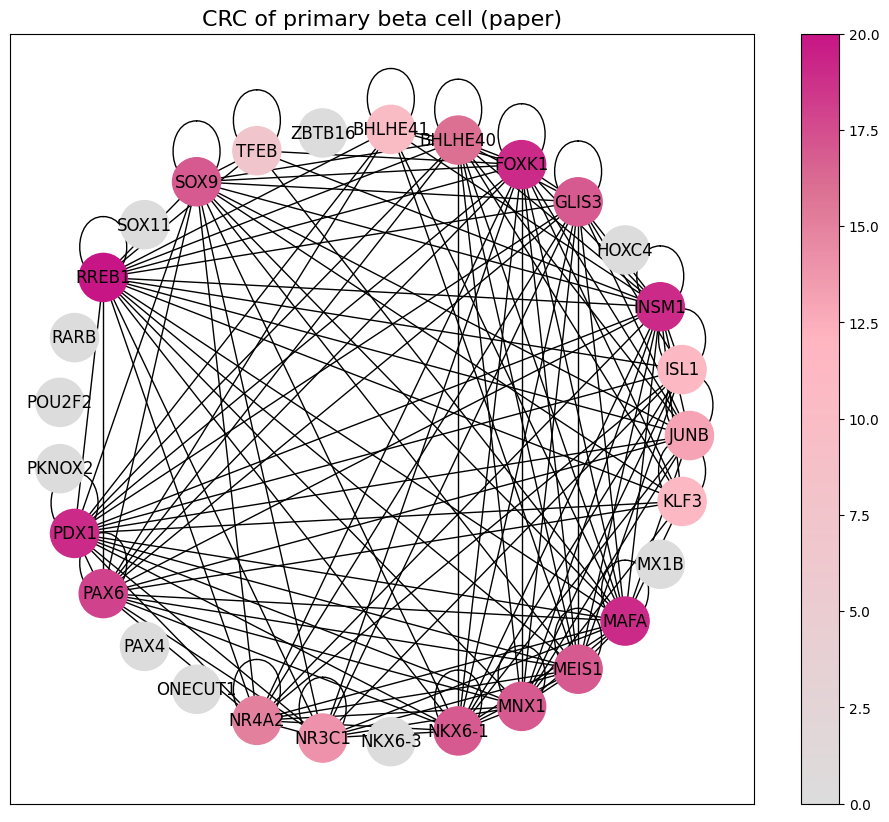

In [205]:
# in order to recreate similar network as in the paper, extract nodes of the network from the paper
nodeListPaper = ['JUNB', 'ISL1', 'INSM1', 'HOXC4', 'GLIS3', 'FOXK1', 'BHLHE40', 'BHLHE41', 'ZBTB16', 'TFEB', 'SOX9', 'SOX11', 'RREB1', 'RARB', 'POU2F2', 'PKNOX2', 'PDX1', 'PAX6', 'PAX4', 'ONECUT1', 'NR4A2', 'NR3C1', 'NKX6-3', 'NKX6-1', 'MNX1', 'MEIS1', 'MAFA', 'MX1B', 'KLF3']

edgeListPaper = []
for pair in edgeCountDict.keys():
    if nodeListPaper.count(pair[0]) and nodeListPaper.count(pair[1]):
        edgeListPaper.append(pair)
        
print(edgeListPaper[:5]) 

# constructing network
title = 'CRC of primary beta cell (paper)'
plt.figure(figsize=(12,10), dpi=100)
plt.title(title, fontsize=16)
G = nx.Graph()
G.add_nodes_from(nodeListPaper)
G.add_edges_from(edgeListPaper)
pos = nx.circular_layout(G)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G, pos)
node_color = [G.degree(v) for v in G]
network = nx.draw_networkx_nodes(G, pos,node_color=node_color,cmap=mycmap, node_size=1200, vmin=0)
plt.colorbar(network)
plt.show()

# Weighted CRC

In [23]:
import json
import pandas as pd
import networkx as nx
# from nxviz import CircosPlot
#from chord import Chord

In [383]:
#'''
folder = '../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/'
crcFile = 'Beta_CRC_SCORES_top4%_mod.txt'
edgesFile = 'Beta_EDGES_top4%_mod.txt'
#'''
'''
folder = '../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/'
crcFile = 'CRUP_HI-32_K27ac_CRC_SCORES_top4%.txt'
edgesFile = 'CRUP_HI-32_K27ac_EDGES_top4%.txt'
'''
'''
folder = '../CRCmapper/3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/'
crcFile = 'CRUP_HI-32_K27ac_CRC_SCORES_top1%.txt'
edgesFile = 'CRUP_HI-32_K27ac_EDGES_top1%.txt'
'''

"\nfolder = '../CRCmapper/3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/'\ncrcFile = 'CRUP_HI-32_K27ac_CRC_SCORES_top1%.txt'\nedgesFile = 'CRUP_HI-32_K27ac_EDGES_top1%.txt'\n"

In [285]:
with open(folder + edgesFile, 'r') as f:
    edges = f.readlines()
    edgeDict = {}
    for edge in edges:
        TF1, TF2, weight = edge.rstrip('\n').split('\t')
        edgeDict[(TF1, TF2)] = float(weight)

In [286]:
with open(folder + crcFile, 'r') as f:
    crcList = f.readlines()[:11]
    topcrc = json.loads(crcList[0].split('\t')[0].replace('\'', '"'))
    top10crc = []
    edgeList = set()
    for crc in crcList:
        crc = json.loads(crc.split('\t')[0].replace('\'', '"'))
        top10crc.append(crc)
        for TF1 in crc:
            for TF2 in crc:
                edgeList.add((TF1, TF2, edgeDict[(TF1, TF2)]))

In [287]:
with open(folder + edgesFile, 'r') as f:
    edges = f.readlines()
    degreeDict = {}
    for edge in edges:
        TF1, TF2, weight = edge.rstrip('\n').split('\t')
        if TF1 not in degreeDict.keys():
            degreeDict[TF1] = 1
        else:
            degreeDict[TF1] += 1

In [288]:
top10crc[:10]

[['MEIS2', 'ZBTB34', 'MNX1', 'NKX6-1', 'HOMEZ'],
 ['MEIS2', 'ZBTB34', 'MNX1', 'FOXP2'],
 ['MEIS2', 'FOXO1', 'ZNF276', 'HOMEZ', 'MNX1', 'NR3C1'],
 ['MEIS2', 'FOXO1', 'ZNF276', 'FOXP2', 'MNX1', 'MEIS1', 'NR3C1'],
 ['MEIS2', 'FOXO1', 'ELF1', 'HOMEZ', 'FOXK1', 'MNX1', 'NKX6-1', 'ZNF77'],
 ['MEIS2', 'FOXO1', 'ELF1', 'HOMEZ', 'FOXK1', 'MNX1', 'NKX6-1', 'NR3C1'],
 ['SREBF1', 'ZNF554', 'FOXJ1', 'HOMEZ', 'ZNF77', 'PRDM15'],
 ['MEIS2', 'RXRA', 'HOMEZ', 'FOXK1', 'MNX1', 'NKX6-1', 'NR3C1'],
 ['MEIS2', 'FOXO1', 'ELF1', 'ZNF513', 'MNX1', 'MEIS1', 'TCF7', 'NR3C1'],
 ['MEIS2',
  'FOXO1',
  'ELF1',
  'HOMEZ',
  'FOXK1',
  'MNX1',
  'NKX6-1',
  'PAX6',
  'FOXA2']]

In [289]:
with open('./thesis_fig/2-2-TAD-TRAP.HI32_nodesDegree_top10.txt', 'w') as f:
    TFset = set()
    for topcrc in top10crc[:10]:
        for TF in topcrc:
            sumWeight = 0
            count = 0
            for pair in edgeDict.keys():
                if (pair[0] == TF) or (pair[1] == TF):
                    sumWeight += edgeDict[pair]
                    count += 1
            # print(sumWeight, sumWeight/count)
            if TF not in TFset:
                print(f'{TF}\t{TF}\t{degreeDict[TF]}\t{sumWeight}')
                #f.write(f'{TF}\t{TF}\t{degreeDict[TF]}\t{sumWeight}\n')
            TFset.add(TF)

MEIS2	MEIS2	66	869.291869680296
ZBTB34	ZBTB34	31	369.97809675421223
MNX1	MNX1	41	489.7528097279533
NKX6-1	NKX6-1	53	716.4259115975901
HOMEZ	HOMEZ	44	577.3490582962668
FOXP2	FOXP2	33	383.585691166139
FOXO1	FOXO1	92	1203.179004733566
ZNF276	ZNF276	73	911.1658099274608
NR3C1	NR3C1	66	783.2038570006481
MEIS1	MEIS1	69	874.1268235012028
ELF1	ELF1	91	1031.597299598525
FOXK1	FOXK1	95	1222.8868103992847
ZNF77	ZNF77	61	717.691094095576
SREBF1	SREBF1	107	1323.2252782636067
ZNF554	ZNF554	39	493.62479353860294
FOXJ1	FOXJ1	67	845.2889262871533
PRDM15	PRDM15	78	936.2175877550382
RXRA	RXRA	78	926.3771258939084
ZNF513	ZNF513	61	753.3099949132854
TCF7	TCF7	84	1091.713357970648
PAX6	PAX6	77	919.0540929987628
FOXA2	FOXA2	77	1007.374251843133


In [267]:
topset = set()
for i in top10crc[:10]:
    topset.update(i)

In [290]:
with open('./thesis_fig/2-2-TAD-TRAP.HI32_edgesWeight_top10.txt', 'w') as f:
    for pair in edgeDict.keys():
        # if (pair[0] in topcrc) and (pair[1] in topcrc):
        if (pair[0] in topset) and (pair[1] in topset):
            f.write(f'{pair[0]}\t{pair[1]}\t{edgeDict[pair]}\n')

In [207]:
sorted(degreeDict.items(), key=lambda x: x[1], reverse = True)

[('PBX1', 35),
 ('RFX1', 35),
 ('SREBF1', 35),
 ('NFIC', 34),
 ('BHLHE40', 34),
 ('RARA', 33),
 ('MAFA', 32),
 ('MZF1', 31),
 ('ZBTB7A', 31),
 ('JUND', 30),
 ('KLF13', 30),
 ('HES1', 30),
 ('RXRA', 30),
 ('SOX9', 30),
 ('MEIS2', 29),
 ('ZKSCAN1', 29),
 ('FOXK1', 29),
 ('ZNF580', 28),
 ('MEF2D', 28),
 ('FOSB', 27),
 ('RFX3', 27),
 ('BHLHE41', 26),
 ('FOXA2', 26),
 ('JUNB', 25),
 ('ZNF697', 25),
 ('PAX6', 25),
 ('NKX6-1', 24),
 ('GLIS2', 23),
 ('NKX2-2', 23),
 ('MNT', 23),
 ('ZNF33B', 23),
 ('KLF9', 22),
 ('FOXJ2', 21),
 ('ARID3A', 21),
 ('PDX1', 20),
 ('PLAGL2', 20),
 ('RREB1', 19),
 ('MNX1', 18),
 ('MLXIP', 18)]

---

In [34]:
G = nx.DiGraph()
G.add_weighted_edges_from(edgeList)

In [35]:
G.degree

DiDegreeView({'FOXK1': 24, 'MEIS2': 38, 'RXRA': 14, 'HOMEZ': 38, 'PAX6': 18, 'NKX6-1': 26, 'FOXO1': 32, 'FOXA2': 18, 'ELF1': 28, 'FOXP2': 16, 'ZNF77': 24, 'MEIS1': 20, 'MNX1': 38, 'ZNF513': 22, 'SREBF1': 12, 'PRDM15': 20, 'FOXJ1': 12, 'TCF7': 16, 'NR3C1': 28, 'ZNF276': 16, 'ZBTB34': 16, 'ZNF554': 12})

In [36]:
len(G.degree)

22

In [37]:
for i in sorted(dict(G.degree).items(), key=lambda x: x[1], reverse=True):
    # print(i[0], end = '\',\'')
    print(i)

('MEIS2', 38)
('HOMEZ', 38)
('MNX1', 38)
('FOXO1', 32)
('ELF1', 28)
('NR3C1', 28)
('NKX6-1', 26)
('FOXK1', 24)
('ZNF77', 24)
('ZNF513', 22)
('MEIS1', 20)
('PRDM15', 20)
('PAX6', 18)
('FOXA2', 18)
('FOXP2', 16)
('TCF7', 16)
('ZNF276', 16)
('ZBTB34', 16)
('RXRA', 14)
('SREBF1', 12)
('FOXJ1', 12)
('ZNF554', 12)


In [696]:
df = nx.to_pandas_adjacency(G, weight='weight', nonedge=0.0)

In [686]:
df.to_csv(folder + 'Beta_EDGES_MATRIX.txt', sep='\t', header=True, index=True)

In [ ]:
names=list(df_tab.columns)
#names

# Passing data (change from df to list of lists)
matrix = df_tab.values.tolist()
#matrix

# Create our diagram
diagram=Chord(matrix, names, font_size_large='10px', wrap_labels=False, margin=100, width=800)


In [667]:
len(G.nodes)

22

In [668]:
# HI-32
G.nodes

NodeView(('NKX6-1', 'ZBTB34', 'ELF1', 'MNX1', 'HOMEZ', 'ZNF554', 'FOXA2', 'FOXO1', 'MEIS1', 'FOXK1', 'MEIS2', 'PRDM15', 'RXRA', 'TCF7', 'NR3C1', 'ZNF276', 'ZNF77', 'FOXJ1', 'FOXP2', 'ZNF513', 'PAX6', 'SREBF1'))

In [634]:
# Beta
G.nodes

NodeView(('PAX6', 'NKX6-1', 'ZNF33B', 'GLIS2', 'MNX1', 'RFX1', 'PBX1', 'MZF1', 'PDX1', 'NFIC', 'FOXA2', 'NKX2-2', 'MAFA', 'SREBF1', 'FOXK1', 'ZNF697', 'PLAGL2', 'FOXJ2', 'ZBTB7A', 'ZKSCAN1'))

In [643]:
# HI-32
G.nodes

NodeView(('JUND', 'MEIS2', 'HNF1A', 'CREB3L2', 'NKX6-1', 'MEIS1', 'MAFB', 'PDX1', 'ZKSCAN1', 'SOX9', 'NKX2-2', 'TEAD1', 'NFIC', 'FOXA2', 'FOXK1', 'RARA', 'SREBF1', 'EHF', 'RFX3', 'ISL1', 'PAX6', 'GLIS2'))

In [669]:
sorted([line for line in edgeList if line[0] == line[1]])

[('ELF1', 'ELF1', 4.93800444807066),
 ('FOXA2', 'FOXA2', 7.185615081585491),
 ('FOXJ1', 'FOXJ1', 5.223900299311979),
 ('FOXK1', 'FOXK1', 5.708694519017222),
 ('FOXO1', 'FOXO1', 6.0067771894897),
 ('FOXP2', 'FOXP2', 6.45581379255481),
 ('HOMEZ', 'HOMEZ', 5.3842849248696085),
 ('MEIS1', 'MEIS1', 9.597213879903228),
 ('MEIS2', 'MEIS2', 8.971559719882574),
 ('MNX1', 'MNX1', 4.653676840350227),
 ('NKX6-1', 'NKX6-1', 9.17888046535791),
 ('NR3C1', 'NR3C1', 5.204836130970294),
 ('PAX6', 'PAX6', 6.0420170633078785),
 ('PRDM15', 'PRDM15', 6.641314718524793),
 ('RXRA', 'RXRA', 5.13810339141779),
 ('SREBF1', 'SREBF1', 7.498152749072048),
 ('TCF7', 'TCF7', 5.828071000199547),
 ('ZBTB34', 'ZBTB34', 5.54899399826442),
 ('ZNF276', 'ZNF276', 6.801325335366291),
 ('ZNF513', 'ZNF513', 7.3660090094499875),
 ('ZNF554', 'ZNF554', 6.3016703857986425),
 ('ZNF77', 'ZNF77', 4.972755864677351)]

In [47]:
from statistics import mean

In [49]:
mean(edgeDict.values())

5.957722473694756

In [46]:
newedgeDict = {}
for line in edgeList:
    newedgeDict[(line[0], line[1])] = edgeDict[(line[0], line[1])]
sorted(newedgeDict.items(), key = lambda x: x[1], reverse = True)

[(('MEIS2', 'MNX1'), 25.19226312216653),
 (('HOMEZ', 'SREBF1'), 17.659870242032326),
 (('MEIS1', 'MNX1'), 15.612176042026759),
 (('HOMEZ', 'ZNF77'), 14.517313088227535),
 (('HOMEZ', 'ZNF554'), 14.517313088227535),
 (('FOXK1', 'FOXA2'), 13.532205550902004),
 (('HOMEZ', 'MEIS2'), 11.915358673933207),
 (('FOXK1', 'NKX6-1'), 11.715149366031934),
 (('FOXO1', 'ZNF276'), 10.519632952049086),
 (('FOXK1', 'PAX6'), 10.358771253465228),
 (('NKX6-1', 'FOXO1'), 10.318312325974691),
 (('NKX6-1', 'ELF1'), 10.318312325974691),
 (('NKX6-1', 'MEIS2'), 10.274235341797148),
 (('ZNF77', 'ELF1'), 10.068638177201972),
 (('ZNF77', 'FOXO1'), 10.068638177201972),
 (('HOMEZ', 'PRDM15'), 9.766553953983207),
 (('MEIS1', 'MEIS1'), 9.597213879903228),
 (('MEIS1', 'ZNF276'), 9.594581804132721),
 (('MEIS1', 'FOXO1'), 9.594580335633857),
 (('MEIS1', 'ELF1'), 9.594580335633857),
 (('NKX6-1', 'NR3C1'), 9.568855579590466),
 (('TCF7', 'MEIS1'), 9.505588327005436),
 (('NKX6-1', 'NKX6-1'), 9.17888046535791),
 (('MEIS1', 'MEI

/project/NeuralNet/software/miniconda3/envs/genetics/lib/python3.7/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


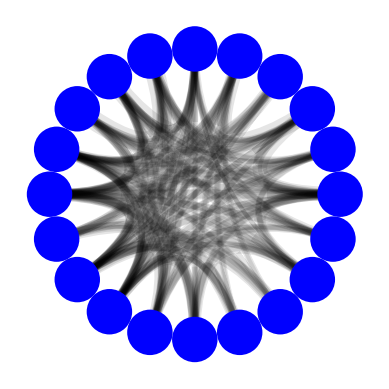

In [592]:
c = CircosPlot(G, edge_width = 'weight',)
    #node_grouping="class",
    #node_color="class",
    #node_order="class",
    #node_labels="class",
    #group_label_position="middle",
    #nodeprops ={"radius":5},
    #node_label_layout="rotation",
    #group_label_color=True,
#c.draw()
#plt.tight_layout(rect=(0.5, 0.5, 0.5, 0.5))
plt.show()

# Pie Plot

ref: https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_and_donut_labels.html#sphx-glr-gallery-pie-and-polar-charts-pie-and-donut-labels-py

https://zhuanlan.zhihu.com/p/26812779

## \# of TF in TADs

In [4]:
from math import ceil
import pandas as pd
import numpy as np
from matplotlib import font_manager as fm

In [2]:
def func(pct, allvals):
    absolute = round(pct/100.*np.sum(allvals))
    return "{:.1f}%\n{:d}".format(pct, absolute)

In [119]:
'''
dfHist = pd.DataFrame({0: 2575, 1: 443, 2: 73, 3: 19, 4: 11, 
                       5: 3, 6: 5, 7: 2, 8: 1, 11: 1, 15: 1,
                       19: 1, 20: 1, 21: 1, 23: 1, 39: 1}.items(), columns=['#TF', '#TAD'])

'''
dfHist = pd.DataFrame({0: 2575, 1: 443, 2: 73, 3: 19, 4: 11, 
                       5: 3, '> 5': 15}.items(), columns=['#TF', '#TAD'])
dfHist

,#TF,#TAD
0,0,2575
1,1,443
2,2,73
3,3,19
4,4,11
5,5,3
6,> 5,15


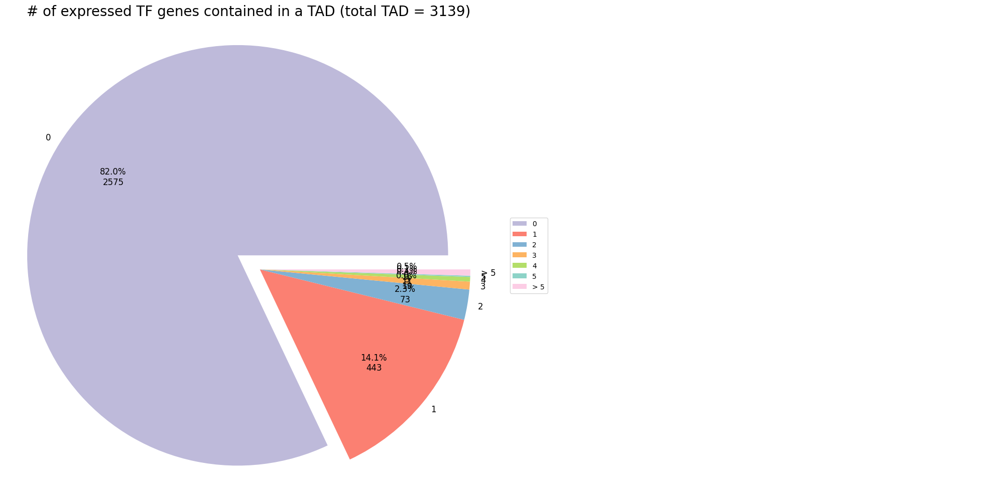

In [185]:
explode = (0.05, 0, 0, 0, 0, 0, 0)

fig, ax = plt.subplots(figsize=(20,10), dpi=100, ncols=2)
ax1, ax2 = ax.ravel()

colors = ['#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#8dd3c7','#fccde5']

# plt.title(f"# of expressed TF genes contained in a TAD (total TAD = {dfHist['#TAD'].sum()})", fontsize=20, loc='center')
patches, text1, text2 = ax1.pie(dfHist["#TAD"],
                                labels=dfHist["#TF"].to_list(),
                                labeldistance=1.05, pctdistance=0.7, radius=0.4, 
                                autopct=lambda pct: func(pct, dfHist['#TAD']),
                                explode=explode, 
                                colors=colors,)
ax1.axis('equal')

# 重新设置字体大小
proptease = fm.FontProperties()
proptease.set_size('large')
# font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
plt.setp(text1, fontproperties=proptease)
plt.setp(text2, fontproperties=proptease)

# ax.legend(dfHist['#TF'].values, loc=2)
ax1.set_title(f"# of expressed TF genes contained in a TAD (total TAD = {dfHist['#TAD'].sum()})", fontsize=20, loc='center')
ax2.axis('off')
ax2.legend(patches, dfHist['#TF'].values, loc='center left')

plt.tight_layout()
plt.savefig('./'+'pie_TAD_TF'+'.pdf', dpi=100)
plt.show()

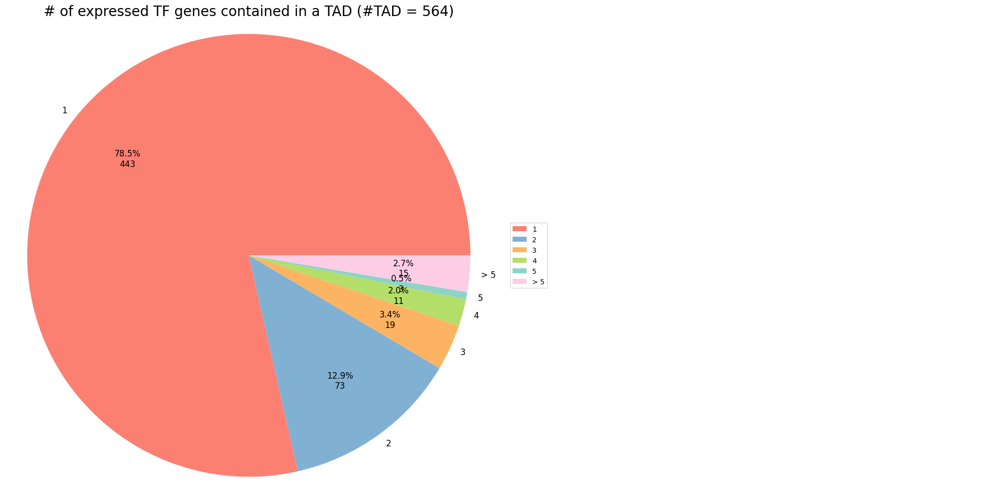

In [188]:
fig, ax = plt.subplots(figsize=(20,10), dpi=100, ncols=2)
ax1, ax2 = ax.ravel()

colors = ['#fb8072','#80b1d3','#fdb462','#b3de69','#8dd3c7','#fccde5']

# plt.title(f"# of expressed TF genes contained in a TAD (#TADs = {dfHist['#TAD'][:14].sum()})", fontsize=16)
patches, text1, text2 = ax1.pie(dfHist["#TAD"][1:],
                                labels=dfHist["#TF"][1:].to_list(),
                                labeldistance=1.05, pctdistance=0.7, radius=0.4, 
                                autopct=lambda pct: func(pct, dfHist['#TAD'][1:]),
                                # explode=explode, 
                                colors=colors,)

ax1.axis('equal')

# 重新设置字体大小
proptease = fm.FontProperties()
proptease.set_size('large')
# font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
plt.setp(text1, fontproperties=proptease)
plt.setp(text2, fontproperties=proptease)

# ax.legend(dfHist['#TF'].values, loc=2)
ax1.set_title(f"# of expressed TF genes contained in a TAD (#TAD = {dfHist['#TAD'][1:].sum()})", fontsize=20, loc='center')
ax2.axis('off')
ax2.legend(patches, dfHist['#TF'][1:].values, loc='center left')

plt.tight_layout()
plt.savefig('./'+'pie_TAD_expressed_TF'+'.pdf', dpi=100)
plt.show()

(-5.4, 41.44499999999999)

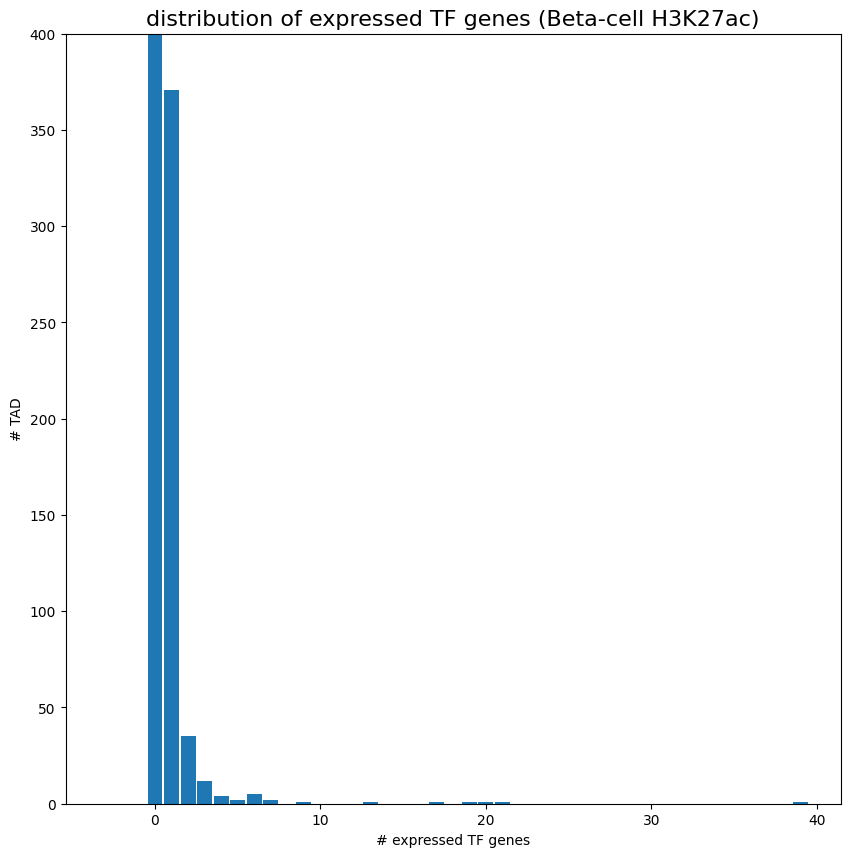

In [64]:
plt.figure(figsize=(10,10), dpi=100)
plt.title('distribution of expressed TF genes (Beta-cell H3K27ac)', fontsize=16)
plt.bar(dfHist['#TF'], dfHist['#TAD'], width=0.9)
plt.xlabel('# expressed TF genes')
plt.ylabel('# TAD')
plt.ylim(0, 400)
plt.xlim(-5.40)

In [65]:
dfHist = pd.DataFrame({1: 357, 3: 11, 2: 33, 4: 5, 5: 2, 
                       7: 2, 17: 1, 21: 2, 20: 1, 13: 1, 
                       6: 5, 9: 1, 39: 1, 0: 2717}.items(), columns=['#TF', '#TAD'])
dfHist

,#TF,#TAD
0,1,357
1,3,11
2,2,33
3,4,5
4,5,2
5,7,2
6,17,1
7,21,2
8,20,1
9,13,1


(-5.4, 41.44499999999999)

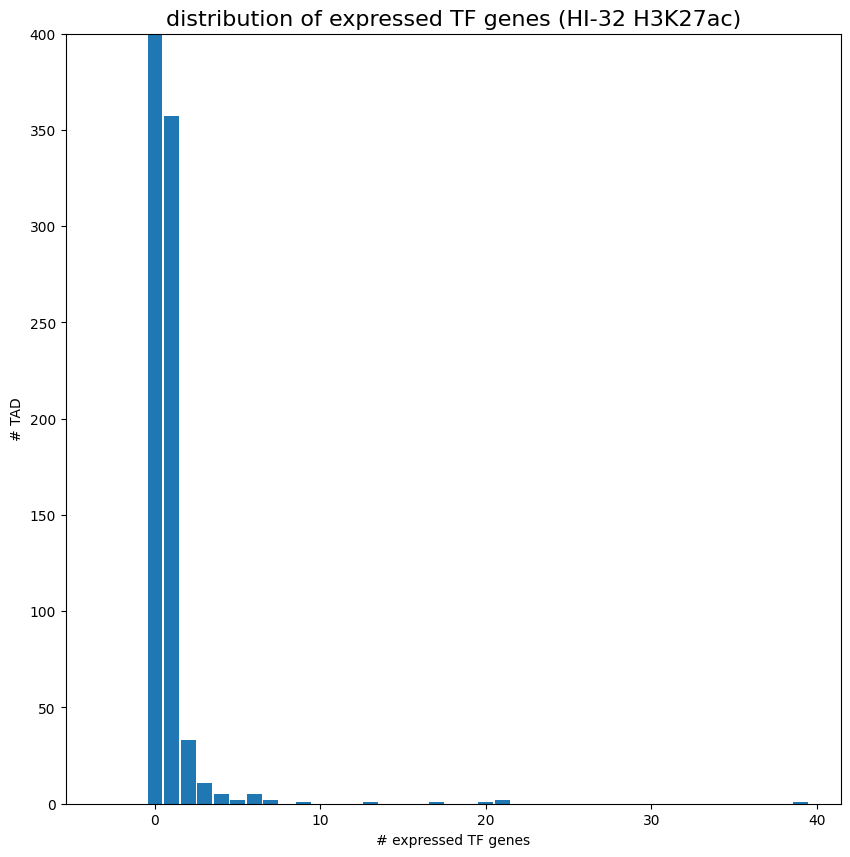

In [66]:
plt.figure(figsize=(10,10), dpi=100)
plt.title('distribution of expressed TF genes (HI-32 H3K27ac)', fontsize=16)
plt.bar(dfHist['#TF'], dfHist['#TAD'], width=0.9)
plt.xlabel('# expressed TF genes')
plt.ylabel('# TAD')
plt.ylim(0, 400)
plt.xlim(-5.40)

## relationship between SE and TAD

In [206]:
# 2-2-TAD-TRAP.Beta_narrow.05_broad.1_incltss_cutoff500_ext500
# 共500个SE
# non-overlapped: 284, partially overlapped: 6, fully contained in a TAD: 210

# 3-1-TAD-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext500
# 共668个SE
# non-overlapped: 449, partially overlapped: 7, fully contained in a TAD: 212

# 2-1-TAD-TRAP.macs2_HI-32_K27ac_narrow.05_broad.05_incltss_cutoffSE_ext500
# 共2119个SE
# non-overlapped: 1389, partially overlapped: 27, fully contained in a TAD: 703
'''
SEdf = pd.DataFrame({'non-overlapped': 284,
                     'fully contained': 210, 
                     'partially overlapped': 6}.items(), columns=['type', '#SE'])
'''
'''
SEdf = pd.DataFrame({'non-overlapped': 449,
                     'fully contained': 212, 
                     'partially overlapped': 7}.items(), columns=['type', '#SE'])
'''

SEdf = pd.DataFrame({'non-overlapped': 1389,
                     'fully contained': 703, 
                     'partially overlapped': 27}.items(), columns=['type', '#SE'])

SEdf

,type,#SE
0,non-overlapped,1389
1,fully contained,703
2,partially overlapped,27


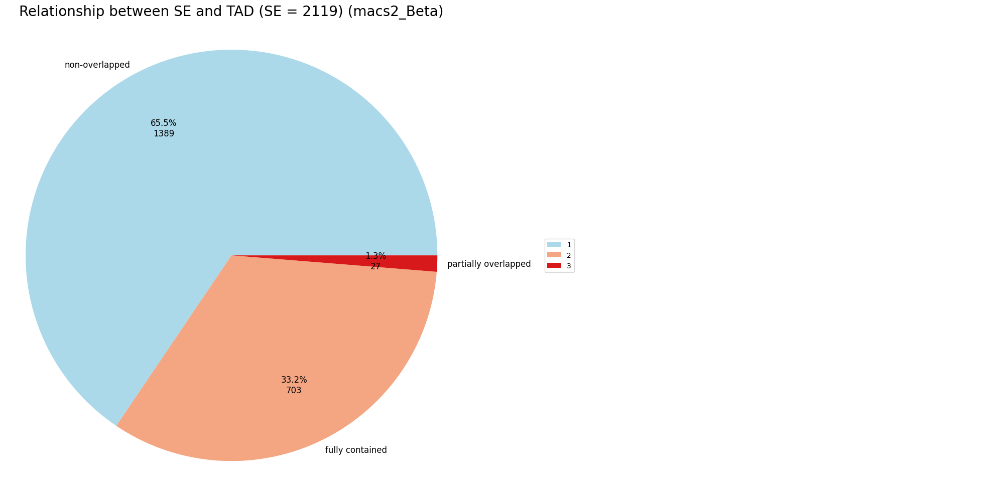

In [207]:
fig, ax = plt.subplots(figsize=(20,10), dpi=100, ncols=2)
ax1, ax2 = ax.ravel()

colors = ['#abd9e9','#f4a582','#d7191c']

# plt.title(f"Relationship between SE and TAD (SE = {SEdf['#SE'].sum()})", fontsize=16)
patches, text1, text2 = ax1.pie(SEdf["#SE"],
                                labels=SEdf["type"],
                                labeldistance=1.05, pctdistance=0.7, radius=0.4, 
                                autopct=lambda pct: func(pct, SEdf["#SE"]),
                                colors=colors,)
ax1.axis('equal')

# 重新设置字体大小
proptease = fm.FontProperties()
proptease.set_size('large')
# font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
plt.setp(text1, fontproperties=proptease)
plt.setp(text2, fontproperties=proptease)

# ax.legend(dfHist['#TF'].values, loc=2)
ax1.set_title(f"Relationship between SE and TAD (SE = {SEdf['#SE'].sum()}) (macs2_Beta)", fontsize=20, loc='center')
ax2.axis('off')
ax2.legend(patches, dfHist['#TF'][1:].values, loc='center left')

plt.tight_layout()
# plt.savefig('./'+'pie_relation_SE_TAD_Beta_macs2'+'.pdf', dpi=100)
plt.show()

In [ ]:
# https://matplotlib.org/stable/gallery/lines_bars_and_markers/horizontal_barchart_distribution.html

## binding sites statistics

In [5]:
bsdf = pd.read_csv('../CRCmapper/2-2-TAD.crc_Beta_narrow.05_broad.1_incltss_cutoff500/Beta_bsSummary.txt', sep='\t', index_col=0)
bsdf.sort_values(by=['#BS', 'TF'], ascending=[True, True], inplace=True)
# bsdf = bsdf.append(round(bsdf.describe().loc['mean']))
bsdf.tail(5)

,TF_TAD,TF_SE,#SE,#BS,#BS_closest_SE_peaks,#BS_closest_SE_flanking,#BS_single_peaks,#BS_single_flanking,#BS_other_SE
TF,,,,,,,,,
ASCL2,chr11(.):2200000-3300000,chr11(.):2196612-2232114,1,111,7,16,33,55,0
NKX6-1,chr4(.):84600000-85500000,chr4(.):85413980-85419674,1,145,0,2,9,134,0
FOXA2,chr20(.):22300000-23650000,chr20(.):22548746-22566220,2,150,1,16,44,75,14
MAZ,chr16(.):29550000-30100000,chr16(.):29816117-29833482,3,176,20,49,24,30,53
SP1,chr12(.):53400000-53900000,chr12(.):53440168-53456027,1,893,45,134,345,369,0


In [6]:
bsdf['closest super-enhancers'] = bsdf['#BS_closest_SE_peaks'] + bsdf['#BS_closest_SE_flanking']
bsdf['typical enhancers'] = bsdf['#BS_single_peaks'] + bsdf['#BS_single_flanking']
bsdf['distal super-enhancers'] = bsdf['#BS_other_SE']

In [8]:
bsdf.iloc[:,8:]

,#BS_other_SE,closest super-enhancers,typical enhancers,distal super-enhancers
TF,,,,
GZF1,1,0,3,1
HIF1A,0,0,4,0
NEUROD1,0,1,3,0
TFEB,0,0,4,0
ERF,0,2,3,0
...,...,...,...,...
ASCL2,0,23,88,0
NKX6-1,0,2,143,0
FOXA2,14,17,119,14


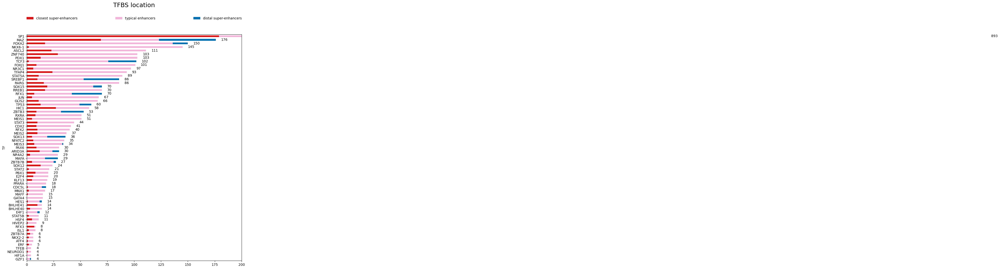

In [407]:
ax = bsdf.iloc[:,9:].plot.barh(align='center', stacked=True, figsize=(12,12),
                               color = ['#d7191c','#f1b6da','#0571b0',])
# ['#d7191c','#fdae61','#f1b6da','#92c5de','#0571b0']
plt.tight_layout()

title = plt.title('TFBS location', pad=80, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=3, 
       borderaxespad=-.46,
       prop={'size':10,})


# ax.bar_label(ax.containers[5], label_type='edge', labels=bsdf.iloc[:,4:].sum(1))
# total = sum(bsdf.sum())
# ax.bar_label(ax, label_type='edge', labels=bsdf.iloc[:,4:].sum(1), padding=0.2)
for x,y in enumerate(bsdf.iloc[:,9:].sum(1)):
    plt.text(y + 5, x, '%s'%y, va='center')


for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)

plt.xlim([0, 200])    
plt.savefig('./'+'TFBS_location_TAD_mod'+'.pdf', dpi=100)
# plt.show()

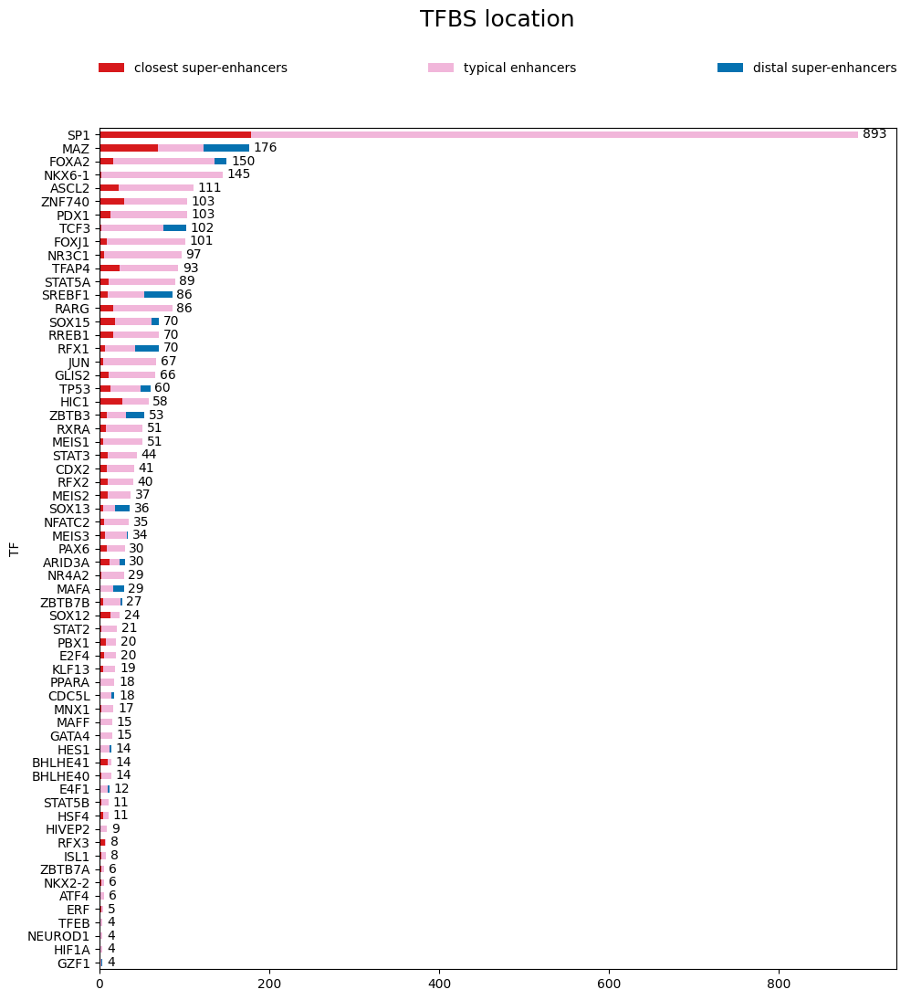

In [18]:
ax = bsdf.iloc[:,9:].plot.barh(align='center', stacked=True, figsize=(12,12),
                               color = ['#d7191c','#f1b6da','#0571b0',])
# ['#d7191c','#fdae61','#f1b6da','#92c5de','#0571b0']
plt.tight_layout()

title = plt.title('TFBS location', pad=80, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=3, 
       borderaxespad=-.46,
       prop={'size':10,})

# ax.bar_label(ax.containers[5], label_type='edge', labels=bsdf.iloc[:,4:].sum(1))
# total = sum(bsdf.sum())
# ax.bar_label(ax, label_type='edge', labels=bsdf.iloc[:,4:].sum(1), padding=0.2)
for x,y in enumerate(bsdf.iloc[:,9:].sum(1)):
    plt.text(y + 5, x, '%s'%y, va='center')


for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.savefig('./'+'TFBS_location_TAD'+'.pdf', dpi=100)

In [36]:
summaryDict = {'#BS_closest_SE_peaks': 3,
               '#BS_closest_SE_flanking': 8, 
               '#BS_single_peaks': 17, 
               '#BS_single_flanking': 27, 
               '#BS_other_SE': 4, 
               '#BS': 59}
summaryDF = pd.DataFrame(summaryDict.values(), index=summaryDict.keys()).transpose()
summaryDF

,#BS_closest_SE_peaks,#BS_closest_SE_flanking,#BS_single_peaks,#BS_single_flanking,#BS_other_SE,#BS
0,3,8,17,27,4,59


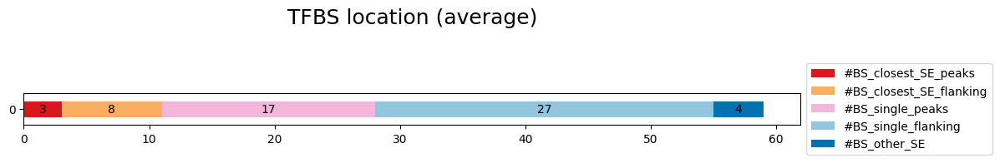

In [100]:
ax = summaryDF.iloc[:,:5].plot.barh(align='center', stacked=True, figsize=(12,0.5),
                                   color = ['#d7191c','#fdae61','#f1b6da','#92c5de','#0571b0'])
# plt.tight_layout()
legend = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
title = plt.title('TFBS location (average)', pad=60, fontsize=18, color='k')

            
for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate(int(width), xy=(left+width/2, bottom+height/2), ha='center', va='center')

ax.get_figure().savefig('./'+'average_TFBS_location_TAD'+'.pdf', dpi=100, bbox_inches = 'tight')

In [101]:
ax.patches

<Axes.ArtistList of 315 patches>

### ext_500 vs ext_0

In [150]:
# './CRCmapper/2-2.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/fimo.txt'
'''
bsDict = {'PDX1': {'enhancer': 1, 'flanking': 12},
         'MEIS1': {'enhancer': 1, 'flanking': 4},
         'BHLHE40': {'enhancer': 2, 'flanking': 1},
         'NEUROD1': {'enhancer': 0, 'flanking': 1},
         'JUND': {'enhancer': 9, 'flanking': 25},
         'RARA': {'enhancer': 10, 'flanking': 14},
         'NKX6-1': {'enhancer': 0, 'flanking': 2},
         'THRA': {'enhancer': 0, 'flanking': 0},
         'NFIC': {'enhancer': 0, 'flanking': 0},
         'GLIS2': {'enhancer': 5, 'flanking': 6},
         'MNX1': {'enhancer': 1, 'flanking': 1},
         'RFX1': {'enhancer': 7, 'flanking': 0},
         'HIVEP2': {'enhancer': 0, 'flanking': 1},
         'FOXK1': {'enhancer': 34, 'flanking': 27},
         'ERF': {'enhancer': 1, 'flanking': 1},
         'SOX13': {'enhancer': 3, 'flanking': 2},
         'RFX2': {'enhancer': 7, 'flanking': 3},
         'DBP': {'enhancer': 3, 'flanking': 1},
         'HES1': {'enhancer': 0, 'flanking': 1},
         'NR3C1': {'enhancer': 1, 'flanking': 5},
         'NR4A2': {'enhancer': 2, 'flanking': 1},
         'RREB1': {'enhancer': 10, 'flanking': 7},
         'MZF1': {'enhancer': 10, 'flanking': 5},
         'MNT': {'enhancer': 2, 'flanking': 0},
         'NKX2-2': {'enhancer': 1, 'flanking': 1},
         'ISL1': {'enhancer': 0, 'flanking': 3},
         'PAX6': {'enhancer': 1, 'flanking': 8},
         'PBX1': {'enhancer': 4, 'flanking': 3},
         'ZBTB7A': {'enhancer': 3, 'flanking': 0},
         'JUNB': {'enhancer': 13, 'flanking': 1},
         'FOXJ2': {'enhancer': 6, 'flanking': 81},
         'RXRA': {'enhancer': 4, 'flanking': 4},
         'JUN': {'enhancer': 2, 'flanking': 3},
         'ARID3A': {'enhancer': 2, 'flanking': 10},
         'MEIS2': {'enhancer': 6, 'flanking': 4},
         'SREBF1': {'enhancer': 3, 'flanking': 11},
         'MAFA': {'enhancer': 0, 'flanking': 0},
         'ATF4': {'enhancer': 0, 'flanking': 1},
         'MEF2D': {'enhancer': 4, 'flanking': 2},
         'RFX3': {'enhancer': 3, 'flanking': 4},
         'FOXA2': {'enhancer': 1, 'flanking': 16},
         'HIF1A': {'enhancer': 0, 'flanking': 0},
         'TFEB': {'enhancer': 0, 'flanking': 1},
         'KLF13': {'enhancer': 5, 'flanking': 0},
         'SOX9': {'enhancer': 7, 'flanking': 17},
         'BHLHE41': {'enhancer': 7, 'flanking': 3}}
'''

'''
# DE
bsDict = {'SOX4': {'enhancer': 27, 'flanking': 14},
         'SP3': {'enhancer': 16, 'flanking': 0},
         'KLF6': {'enhancer': 0, 'flanking': 0},
         'PITX2': {'enhancer': 2, 'flanking': 1},
         'MYCN': {'enhancer': 4, 'flanking': 0},
         'LHX1': {'enhancer': 3, 'flanking': 4},
         'GSC': {'enhancer': 6, 'flanking': 0},
         'YY1': {'enhancer': 1, 'flanking': 1},
         'ELK4': {'enhancer': 6, 'flanking': 0},
         'TGIF1': {'enhancer': 10, 'flanking': 8},
         'GATA4': {'enhancer': 5, 'flanking': 3},
         'SIX3': {'enhancer': 0, 'flanking': 1},
         'PKNOX1': {'enhancer': 1, 'flanking': 3},
         'ETS2': {'enhancer': 0, 'flanking': 0},
         'CREB3L2': {'enhancer': 0, 'flanking': 0},
         'ELF2': {'enhancer': 1, 'flanking': 1},
         'ZNF217': {'enhancer': 4, 'flanking': 0},
         'RARB': {'enhancer': 3, 'flanking': 8},
         'TCF7L1': {'enhancer': 5, 'flanking': 1},
         'PBX1': {'enhancer': 1, 'flanking': 2},
         'SALL2': {'enhancer': 6, 'flanking': 3},
         'JUND': {'enhancer': 6, 'flanking': 1},
         'KLF7': {'enhancer': 2, 'flanking': 2},
         'TCF7L2': {'enhancer': 22, 'flanking': 4},
         'NFATC2': {'enhancer': 0, 'flanking': 0},
         'SOX17': {'enhancer': 2, 'flanking': 4},
         'GATA6': {'enhancer': 7, 'flanking': 2},
         'FOXA2': {'enhancer': 12, 'flanking': 10},
         'OTX2': {'enhancer': 9, 'flanking': 3},
         'ZIC2': {'enhancer': 25, 'flanking': 2},
         'ZIC3': {'enhancer': 18, 'flanking': 1},
         'FOXH1': {'enhancer': 1, 'flanking': 0},
         'SMAD2': {'enhancer': 0, 'flanking': 0},
         'E2F3': {'enhancer': 14, 'flanking': 4},
         'MYC': {'enhancer': 2, 'flanking': 0},
         'MYB': {'enhancer': 0, 'flanking': 0},
         'GZF1': {'enhancer': 0, 'flanking': 0},
         'NR2F6': {'enhancer': 14, 'flanking': 4},
         'SOX13': {'enhancer': 9, 'flanking': 1},
         'MSC': {'enhancer': 0, 'flanking': 1},
         'EOMES': {'enhancer': 12, 'flanking': 0}}
'''

'''
# 3-1.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext500
bsDict = {'FOXP2': {'enhancer': 11, 'flanking': 3},
         'RFX2': {'enhancer': 22, 'flanking': 3},
         'MEIS1': {'enhancer': 21, 'flanking': 12},
         'ISL1': {'enhancer': 3, 'flanking': 0},
         'RFX3': {'enhancer': 12, 'flanking': 0},
         'SATB1': {'enhancer': 11, 'flanking': 4},
         'INSM1': {'enhancer': 2, 'flanking': 1},
         'EHF': {'enhancer': 31, 'flanking': 9},
         'HNF1A': {'enhancer': 25, 'flanking': 9},
         'PAX6': {'enhancer': 13, 'flanking': 6},
         'TFEB': {'enhancer': 2, 'flanking': 1},
         'NKX6-1': {'enhancer': 47, 'flanking': 16},
         'CREB3L2': {'enhancer': 5, 'flanking': 2},
         'EGR4': {'enhancer': 1, 'flanking': 5},
         'MAFA': {'enhancer': 11, 'flanking': 1},
         'JUND': {'enhancer': 37, 'flanking': 4},
         'HLF': {'enhancer': 0, 'flanking': 1},
         'XBP1': {'enhancer': 6, 'flanking': 0},
         'HSF4': {'enhancer': 3, 'flanking': 0},
         'RXRA': {'enhancer': 24, 'flanking': 12},
         'ELF3': {'enhancer': 8, 'flanking': 22},
         'FOXK1': {'enhancer': 27, 'flanking': 19},
         'TEAD1': {'enhancer': 55, 'flanking': 15},
         'FOXA2': {'enhancer': 48, 'flanking': 11},
         'MNT': {'enhancer': 0, 'flanking': 1},
         'MNX1': {'enhancer': 1, 'flanking': 0},
         'RREB1': {'enhancer': 45, 'flanking': 25},
         'GLIS2': {'enhancer': 18, 'flanking': 14},
         'NFIC': {'enhancer': 0, 'flanking': 0},
         'MEIS2': {'enhancer': 32, 'flanking': 8},
         'PDX1': {'enhancer': 16, 'flanking': 5},
         'SREBF1': {'enhancer': 51, 'flanking': 8},
         'ARID3A': {'enhancer': 1, 'flanking': 0},
         'BHLHE40': {'enhancer': 2, 'flanking': 2},
         'MEF2D': {'enhancer': 9, 'flanking': 6},
         'RARA': {'enhancer': 62, 'flanking': 23},
         'HES1': {'enhancer': 13, 'flanking': 3},
         'JUNB': {'enhancer': 15, 'flanking': 0},
         'ARID5B': {'enhancer': 4, 'flanking': 5},
         'SOX13': {'enhancer': 8, 'flanking': 4},
         'NKX2-2': {'enhancer': 5, 'flanking': 7},
         'SOX9': {'enhancer': 21, 'flanking': 6},
         'PROX1': {'enhancer': 1, 'flanking': 0},
         'MAFB': {'enhancer': 88, 'flanking': 22}}
'''
#'''
# 1-1.crc_CRUP_HI-32_K27ac_incltss_peakCutoff0.5_cutoffSE_ext500
bsDict = {'THRA': {'enhancer': 1, 'flanking': 3},
         'NFE2L2': {'enhancer': 16, 'flanking': 2},
         'FOXP2': {'enhancer': 16, 'flanking': 2},
         'RFX2': {'enhancer': 33, 'flanking': 1},
         'MEIS1': {'enhancer': 68, 'flanking': 34},
         'ISL1': {'enhancer': 5, 'flanking': 1},
         'HIVEP2': {'enhancer': 2, 'flanking': 4},
         'RFX3': {'enhancer': 18, 'flanking': 1},
         'SATB1': {'enhancer': 25, 'flanking': 9},
         'HNF4A': {'enhancer': 50, 'flanking': 31},
         'YY1': {'enhancer': 18, 'flanking': 15},
         'ELK4': {'enhancer': 6, 'flanking': 4},
         'INSM1': {'enhancer': 4, 'flanking': 2},
         'EHF': {'enhancer': 49, 'flanking': 10},
         'HNF1A': {'enhancer': 25, 'flanking': 9},
         'FOXJ2': {'enhancer': 18, 'flanking': 10},
         'KLF11': {'enhancer': 38, 'flanking': 5},
         'ATF1': {'enhancer': 2, 'flanking': 1},
         'TFEB': {'enhancer': 4, 'flanking': 3},
         'GLIS3': {'enhancer': 8, 'flanking': 2},
         'PAX6': {'enhancer': 29, 'flanking': 5},
         'ZBTB7A': {'enhancer': 9, 'flanking': 4},
         'HIF1A': {'enhancer': 0, 'flanking': 2},
         'CREB3L2': {'enhancer': 9, 'flanking': 1},
         'NKX6-1': {'enhancer': 88, 'flanking': 60},
         'EGR4': {'enhancer': 17, 'flanking': 2},
         'MAFA': {'enhancer': 15, 'flanking': 0},
         'PBX1': {'enhancer': 11, 'flanking': 6},
         'HLF': {'enhancer': 0, 'flanking': 2},
         'XBP1': {'enhancer': 6, 'flanking': 0},
         'DBP': {'enhancer': 5, 'flanking': 1},
         'HSF4': {'enhancer': 4, 'flanking': 1},
         'ETS1': {'enhancer': 31, 'flanking': 5},
         'FOXO1': {'enhancer': 106, 'flanking': 52},
         'RXRA': {'enhancer': 91, 'flanking': 28},
         'GATA6': {'enhancer': 9, 'flanking': 0},
         'ELF3': {'enhancer': 54, 'flanking': 31},
         'KLF13': {'enhancer': 30, 'flanking': 5},
         'FOXK1': {'enhancer': 63, 'flanking': 11},
         'TEAD1': {'enhancer': 127, 'flanking': 24},
         'FOXA2': {'enhancer': 60, 'flanking': 12},
         'TEF': {'enhancer': 2, 'flanking': 3},
         'RXRG': {'enhancer': 18, 'flanking': 2},
         'MNT': {'enhancer': 2, 'flanking': 3},
         'MNX1': {'enhancer': 6, 'flanking': 0},
         'RREB1': {'enhancer': 158, 'flanking': 57},
         'ATF4': {'enhancer': 7, 'flanking': 7},
         'GLIS2': {'enhancer': 32, 'flanking': 15},
         'NFIC': {'enhancer': 0, 'flanking': 0},
         'BHLHE41': {'enhancer': 12, 'flanking': 0},
         'NR4A2': {'enhancer': 7, 'flanking': 4},
         'MEIS2': {'enhancer': 123, 'flanking': 32},
         'SREBF1': {'enhancer': 238, 'flanking': 26},
         'ARID3A': {'enhancer': 2, 'flanking': 2},
         'PDX1': {'enhancer': 35, 'flanking': 1},
         'RARA': {'enhancer': 96, 'flanking': 23},
         'MEF2D': {'enhancer': 11, 'flanking': 4},
         'BHLHE40': {'enhancer': 3, 'flanking': 2},
         'HES1': {'enhancer': 18, 'flanking': 0},
         'JUNB': {'enhancer': 15, 'flanking': 3},
         'ARID5B': {'enhancer': 22, 'flanking': 7},
         'SOX13': {'enhancer': 12, 'flanking': 3},
         'NKX2-2': {'enhancer': 17, 'flanking': 3},
         'SOX9': {'enhancer': 76, 'flanking': 21},
         'PROX1': {'enhancer': 1, 'flanking': 0},
         'MAFB': {'enhancer': 116, 'flanking': 20}}
#'''
'''
# # 3-1.crc_CRUP_HI-32_K27ac_incltss_peakCutoff0.5_cutoffSE_ext0
bsDict = {'THRA': {'enhancer': 0, 'flanking': 1},
         'NFE2L2': {'enhancer': 7, 'flanking': 9},
         'FOXP2': {'enhancer': 1, 'flanking': 13},
         'RFX2': {'enhancer': 10, 'flanking': 18},
         'MEIS1': {'enhancer': 8, 'flanking': 41},
         'ISL1': {'enhancer': 1, 'flanking': 3},
         'HIVEP2': {'enhancer': 1, 'flanking': 1},
         'RFX3': {'enhancer': 1, 'flanking': 13},
         'SATB1': {'enhancer': 6, 'flanking': 16},
         'HNF4A': {'enhancer': 2, 'flanking': 48},
         'YY1': {'enhancer': 0, 'flanking': 14},
         'ELK4': {'enhancer': 1, 'flanking': 4},
         'INSM1': {'enhancer': 2, 'flanking': 2},
         'EHF': {'enhancer': 14, 'flanking': 23},
         'HNF1A': {'enhancer': 1, 'flanking': 13},
         'FOXJ2': {'enhancer': 4, 'flanking': 13},
         'KLF11': {'enhancer': 17, 'flanking': 19},
         'ATF1': {'enhancer': 1, 'flanking': 1},
         'TFEB': {'enhancer': 0, 'flanking': 3},
         'GLIS3': {'enhancer': 1, 'flanking': 7},
         'PAX6': {'enhancer': 8, 'flanking': 14},
         'ZBTB7A': {'enhancer': 2, 'flanking': 7},
         'HIF1A': {'enhancer': 0, 'flanking': 0},
         'CREB3L2': {'enhancer': 1, 'flanking': 5},
         'NKX6-1': {'enhancer': 6, 'flanking': 74},
         'EGR4': {'enhancer': 1, 'flanking': 4},
         'MAFA': {'enhancer': 10, 'flanking': 4},
         'PBX1': {'enhancer': 1, 'flanking': 8},
         'HLF': {'enhancer': 0, 'flanking': 0},
         'XBP1': {'enhancer': 4, 'flanking': 0},
         'DBP': {'enhancer': 0, 'flanking': 5},
         'HSF4': {'enhancer': 1, 'flanking': 3},
         'ETS1': {'enhancer': 8, 'flanking': 21},
         'FOXO1': {'enhancer': 14, 'flanking': 82},
         'RXRA': {'enhancer': 14, 'flanking': 60},
         'GATA6': {'enhancer': 3, 'flanking': 5},
         'ELF3': {'enhancer': 15, 'flanking': 36},
         'KLF13': {'enhancer': 13, 'flanking': 13},
         'FOXK1': {'enhancer': 12, 'flanking': 40},
         'TEAD1': {'enhancer': 37, 'flanking': 80},
         'FOXA2': {'enhancer': 16, 'flanking': 39},
         'TEF': {'enhancer': 0, 'flanking': 2},
         'RXRG': {'enhancer': 4, 'flanking': 14},
         'MNT': {'enhancer': 0, 'flanking': 2},
         'MNX1': {'enhancer': 2, 'flanking': 4},
         'RREB1': {'enhancer': 18, 'flanking': 107},
         'ATF4': {'enhancer': 1, 'flanking': 5},
         'GLIS2': {'enhancer': 14, 'flanking': 14},
         'NFIC': {'enhancer': 0, 'flanking': 0},
         'BHLHE41': {'enhancer': 1, 'flanking': 3},
         'NR4A2': {'enhancer': 2, 'flanking': 4},
         'MEIS2': {'enhancer': 18, 'flanking': 91},
         'SREBF1': {'enhancer': 50, 'flanking': 144},
         'ARID3A': {'enhancer': 0, 'flanking': 1},
         'PDX1': {'enhancer': 2, 'flanking': 19},
         'RARA': {'enhancer': 14, 'flanking': 52},
         'MEF2D': {'enhancer': 1, 'flanking': 5},
         'BHLHE40': {'enhancer': 0, 'flanking': 3},
         'HES1': {'enhancer': 6, 'flanking': 10},
         'JUNB': {'enhancer': 4, 'flanking': 2},
         'ARID5B': {'enhancer': 2, 'flanking': 16},
         'SOX13': {'enhancer': 4, 'flanking': 6},
         'NKX2-2': {'enhancer': 5, 'flanking': 11},
         'SOX9': {'enhancer': 9, 'flanking': 53},
         'PROX1': {'enhancer': 1, 'flanking': 0},
         'MAFB': {'enhancer': 26, 'flanking': 70}}
'''

'''
# macs2 HI-32
bsDict = {'MEIS1': {'enhancer': 8, 'flanking': 2},
         'ISL1': {'enhancer': 4, 'flanking': 2},
         'HIVEP2': {'enhancer': 3, 'flanking': 2},
         'RFX3': {'enhancer': 5, 'flanking': 6},
         'SIX3': {'enhancer': 1, 'flanking': 1},
         'TFAP4': {'enhancer': 10, 'flanking': 9},
         'GLIS3': {'enhancer': 2, 'flanking': 3},
         'MAFA': {'enhancer': 1, 'flanking': 0},
         'NFATC4': {'enhancer': 4, 'flanking': 1},
         'NR3C2': {'enhancer': 0, 'flanking': 1},
         'FOXO1': {'enhancer': 28, 'flanking': 45},
         'FOXK1': {'enhancer': 17, 'flanking': 15},
         'KLF13': {'enhancer': 11, 'flanking': 11},
         'FOXA2': {'enhancer': 30, 'flanking': 30},
         'RREB1': {'enhancer': 12, 'flanking': 8},
         'NFIC': {'enhancer': 0, 'flanking': 0},
         'STAT1': {'enhancer': 12, 'flanking': 16},
         'MEF2D': {'enhancer': 3, 'flanking': 2},
         'CREB5': {'enhancer': 0, 'flanking': 1},
         'JUN': {'enhancer': 3, 'flanking': 3},
         'MAFB': {'enhancer': 22, 'flanking': 29},
         'THRA': {'enhancer': 0, 'flanking': 0},
         'INSM1': {'enhancer': 1, 'flanking': 0},
         'ZBTB7A': {'enhancer': 4, 'flanking': 0},
         'ZNF217': {'enhancer': 0, 'flanking': 0},
         'FOXJ3': {'enhancer': 6, 'flanking': 22},
         'KLF7': {'enhancer': 7, 'flanking': 0},
         'DBP': {'enhancer': 1, 'flanking': 2},
         'RXRA': {'enhancer': 6, 'flanking': 5},
         'MAFG': {'enhancer': 2, 'flanking': 1},
         'GLIS2': {'enhancer': 11, 'flanking': 8},
         'SP1': {'enhancer': 239, 'flanking': 9},
         'STAT3': {'enhancer': 11, 'flanking': 5},
         'NR4A2': {'enhancer': 1, 'flanking': 1},
         'MEIS2': {'enhancer': 15, 'flanking': 6},
         'IKZF2': {'enhancer': 5, 'flanking': 5},
         'NR4A1': {'enhancer': 14, 'flanking': 10},
         'RARA': {'enhancer': 22, 'flanking': 18},
         'HES1': {'enhancer': 2, 'flanking': 7},
         'ARID5B': {'enhancer': 6, 'flanking': 8},
         'NKX2-2': {'enhancer': 0, 'flanking': 0},
         'SOX9': {'enhancer': 33, 'flanking': 26},
         'PROX1': {'enhancer': 1, 'flanking': 1},
         'FOS': {'enhancer': 0, 'flanking': 0},
         'FOXP2': {'enhancer': 3, 'flanking': 3},
         'KLF6': {'enhancer': 0, 'flanking': 0},
         'YY1': {'enhancer': 19, 'flanking': 6},
         'BHLHA15': {'enhancer': 0, 'flanking': 0},
         'EHF': {'enhancer': 9, 'flanking': 11},
         'FOXJ2': {'enhancer': 3, 'flanking': 36},
         'PAX6': {'enhancer': 1, 'flanking': 6},
         'TFEB': {'enhancer': 0, 'flanking': 0},
         'NKX6-1': {'enhancer': 8, 'flanking': 23},
         'ATF7': {'enhancer': 0, 'flanking': 0},
         'CDC5L': {'enhancer': 0, 'flanking': 1},
         'EGR4': {'enhancer': 11, 'flanking': 1},
         'HLF': {'enhancer': 2, 'flanking': 0},
         'ESR1': {'enhancer': 5, 'flanking': 6},
         'XBP1': {'enhancer': 3, 'flanking': 0},
         'ELF1': {'enhancer': 1, 'flanking': 3},
         'ELF3': {'enhancer': 6, 'flanking': 36},
         'TEAD1': {'enhancer': 7, 'flanking': 23},
         'ATF4': {'enhancer': 3, 'flanking': 4},
         'SREBF1': {'enhancer': 13, 'flanking': 10},
         'PDX1': {'enhancer': 0, 'flanking': 11},
         'SOX13': {'enhancer': 3, 'flanking': 3},
         'MAFF': {'enhancer': 4, 'flanking': 1},
         'IRX2': {'enhancer': 0, 'flanking': 0},
         'FOXP1': {'enhancer': 14, 'flanking': 33},
         'KLF3': {'enhancer': 3, 'flanking': 0},
         'RFX2': {'enhancer': 7, 'flanking': 5},
         'SATB1': {'enhancer': 6, 'flanking': 8},
         'GRHL1': {'enhancer': 1, 'flanking': 1},
         'HNF1A': {'enhancer': 12, 'flanking': 23},
         'KLF11': {'enhancer': 2, 'flanking': 10},
         'ATF1': {'enhancer': 0, 'flanking': 0},
         'NEUROD1': {'enhancer': 0, 'flanking': 2},
         'CREB3L2': {'enhancer': 0, 'flanking': 2},
         'BCL6': {'enhancer': 10, 'flanking': 22},
         'ERF': {'enhancer': 4, 'flanking': 1},
         'RFX1': {'enhancer': 7, 'flanking': 0},
         'PBX1': {'enhancer': 4, 'flanking': 6},
         'HOMEZ': {'enhancer': 0, 'flanking': 2},
         'ATF2': {'enhancer': 0, 'flanking': 1},
         'NFE2L1': {'enhancer': 0, 'flanking': 1},
         'TEF': {'enhancer': 4, 'flanking': 1},
         'RELA': {'enhancer': 2, 'flanking': 1},
         'MNX1': {'enhancer': 7, 'flanking': 0},
         'MNT': {'enhancer': 0, 'flanking': 2},
         'BHLHE41': {'enhancer': 9, 'flanking': 0},
         'PPARA': {'enhancer': 2, 'flanking': 3},
         'ETV1': {'enhancer': 1, 'flanking': 0},
         'BHLHE40': {'enhancer': 2, 'flanking': 1},
         'ETS1': {'enhancer': 7, 'flanking': 8}}
'''
bsDF = pd.DataFrame(bsDict.values(), index=bsDict.keys())
bsDF = bsDF.sort_index(key=bsDF.sum(1).get, ascending=True)
bsDF.head()

,enhancer,flanking
NFIC,0,0
PROX1,1,0
HIF1A,0,2
HLF,0,2
ATF1,2,1


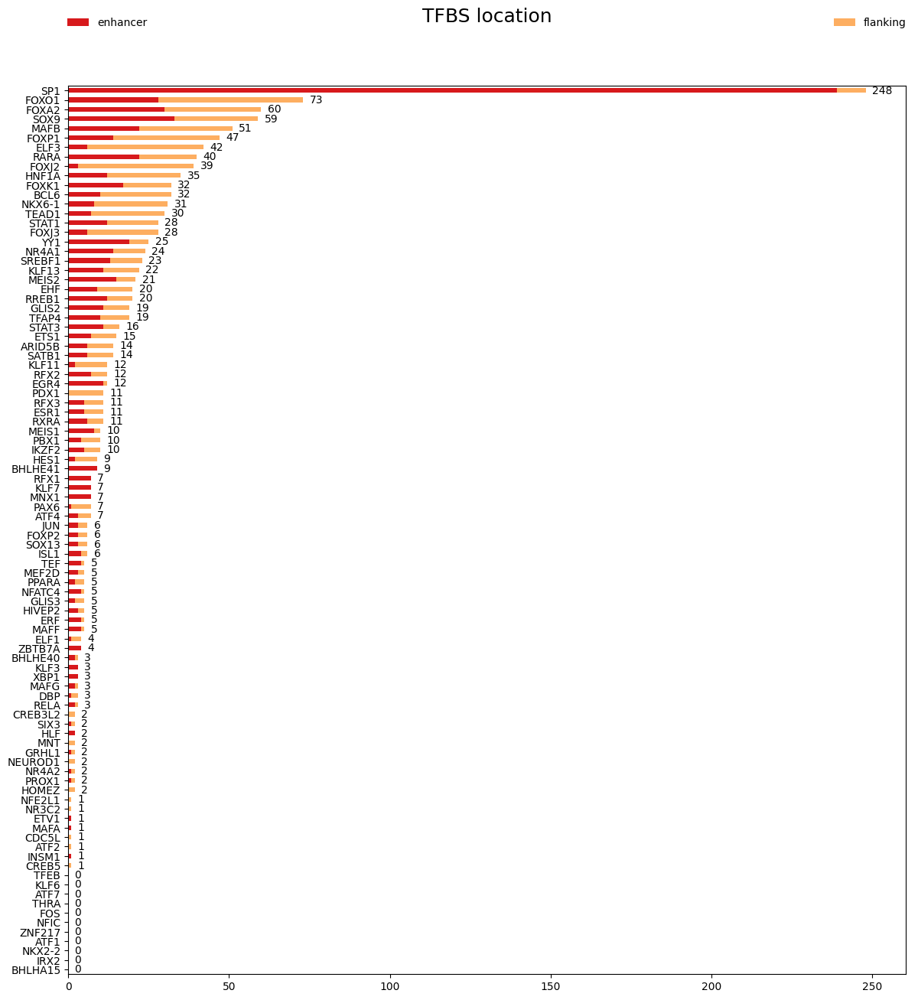

In [532]:
ax = bsDF.plot.barh(align='center', stacked=True, figsize=(15,15), 
                    color = ['#d7191c','#fdae61']) #0571b0
plt.tight_layout()

title = plt.title('TFBS location', pad=60, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=2, 
       borderaxespad=-.46,
       prop={'size':10,})

for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
for x,y in enumerate(bsDF.sum(1)):
    plt.text(y + 2, x, '%s'%y, va='center')
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.axvline(3, color='k', linestyle='--', )
    
#plt.savefig('./'+'TFBS_location'+'.pdf', dpi=100)
# macs2 HI-32

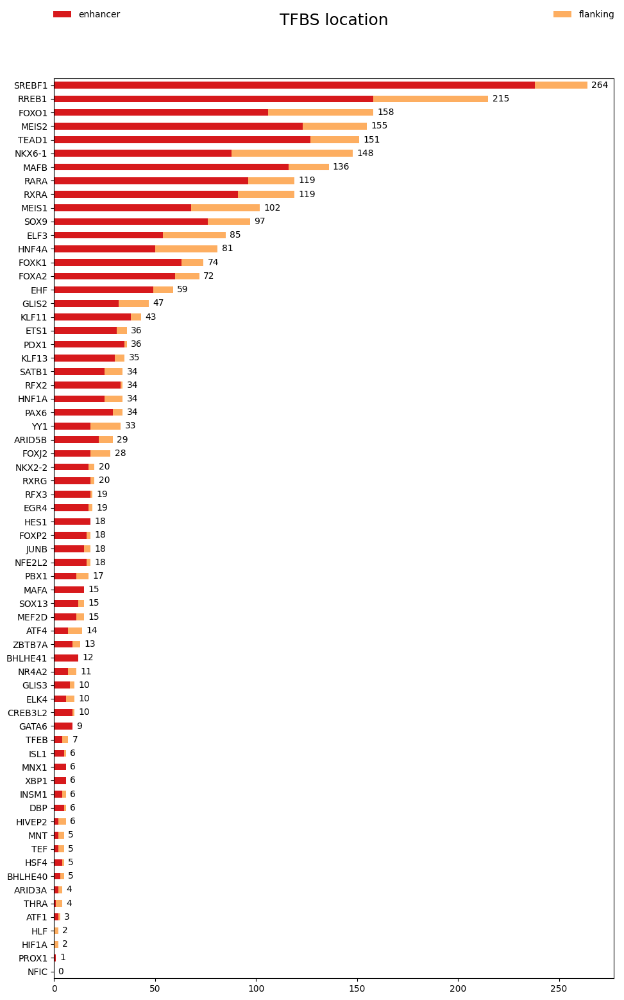

In [161]:
ax = bsDF.plot.barh(align='center', stacked=True, figsize=(12,18), 
                    color = ['#d7191c','#fdae61']) #0571b0
plt.tight_layout()

title = plt.title('TFBS location', pad=60, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=2, 
       borderaxespad=-.46,
       prop={'size':10,})

for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
for x,y in enumerate(bsDF.sum(1)):
    plt.text(y + 2, x, '%s'%y, va='center')
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.axvline(3, color='k', linestyle='--', )
    
plt.savefig('./thesis_fig/'+'R2_crup_TFBS_location'+'.svg', dpi=100)
# CRUP ext500
# enhancer    33.424242
# flanking     9.575758

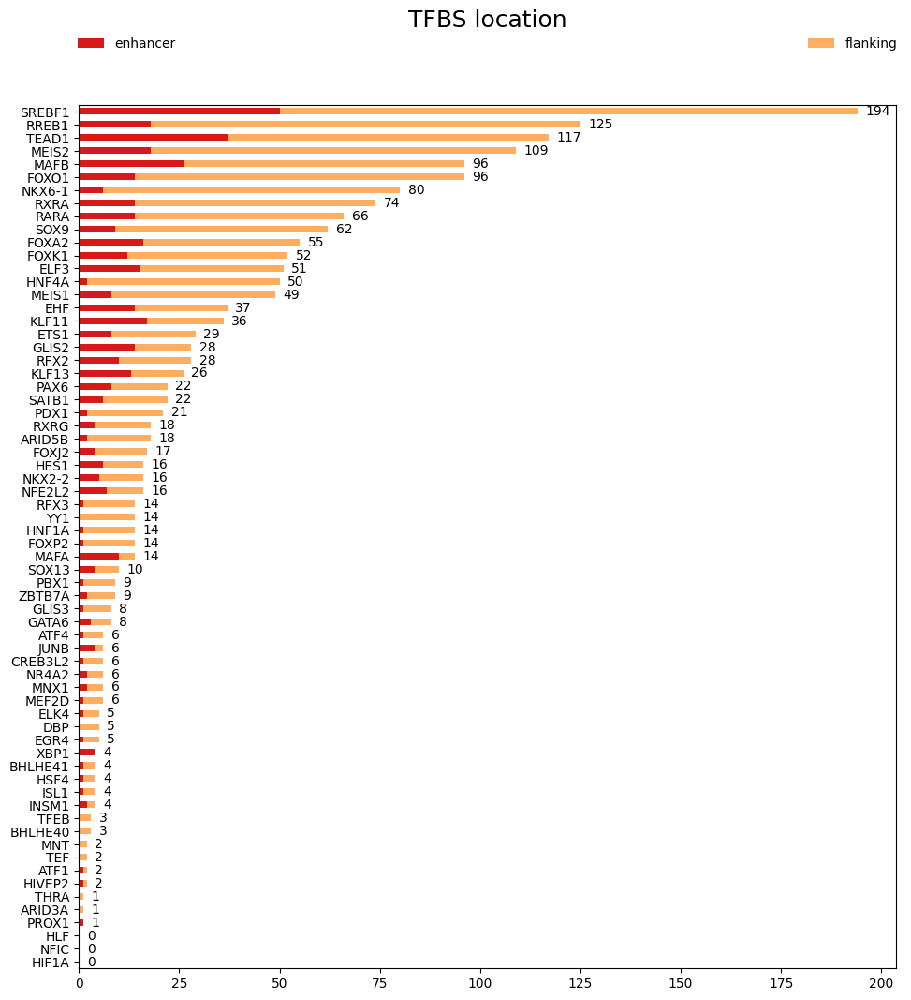

In [63]:
ax = bsDF.plot.barh(align='center', stacked=True, figsize=(12,12), 
                    color = ['#d7191c','#fdae61']) #0571b0
plt.tight_layout()

title = plt.title('TFBS location', pad=60, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=2, 
       borderaxespad=-.46,
       prop={'size':10,})

for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
for x,y in enumerate(bsDF.sum(1)):
    plt.text(y + 2, x, '%s'%y, va='center')
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.axvline(3, color='k', linestyle='--', )
    
#plt.savefig('./'+'TFBS_location'+'.pdf', dpi=100)
# CRUP ext0
# enhancer    33.424242
# flanking     9.575758

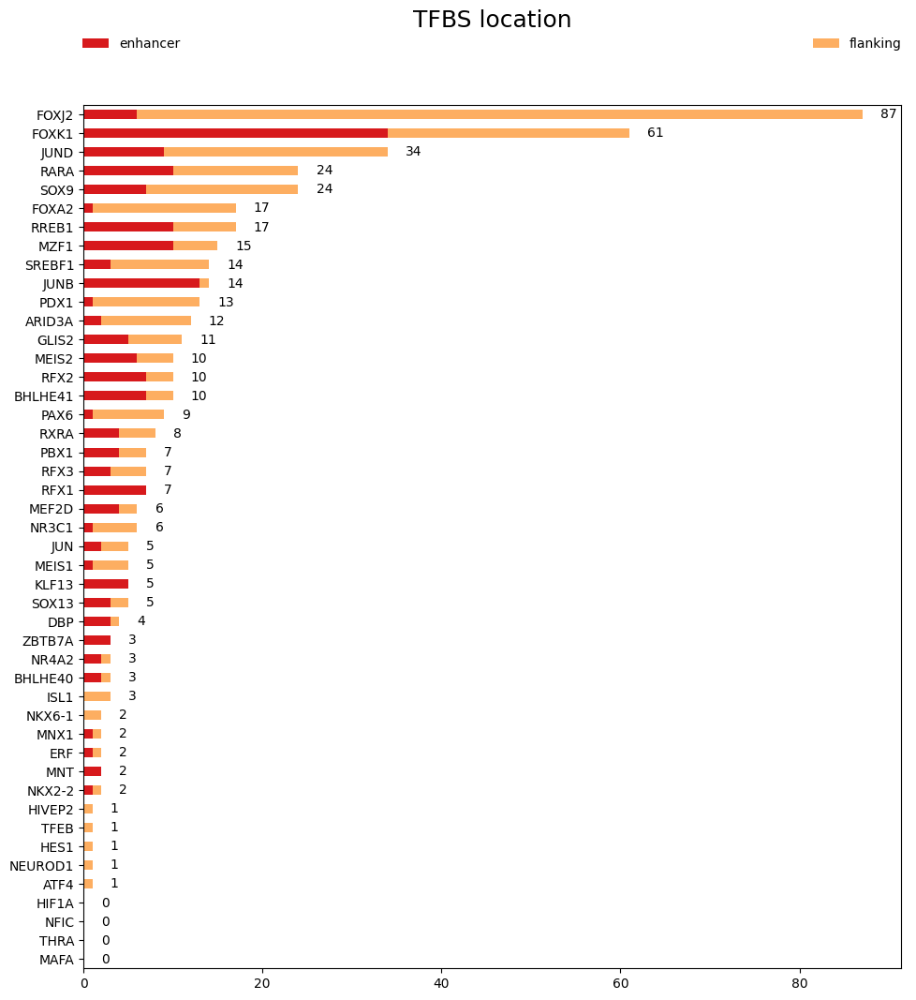

In [527]:
ax = bsDF.plot.barh(align='center', stacked=True, figsize=(12,12), 
                    color = ['#d7191c','#fdae61']) #0571b0
plt.tight_layout()

title = plt.title('TFBS location', pad=60, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=2, 
       borderaxespad=-.46,
       prop={'size':10,})

for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
for x,y in enumerate(bsDF.sum(1)):
    plt.text(y + 2, x, '%s'%y, va='center')
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.axvline(3, color='k', linestyle='--', )
    
#plt.savefig('./'+'TFBS_location'+'.pdf', dpi=100)
# Beta

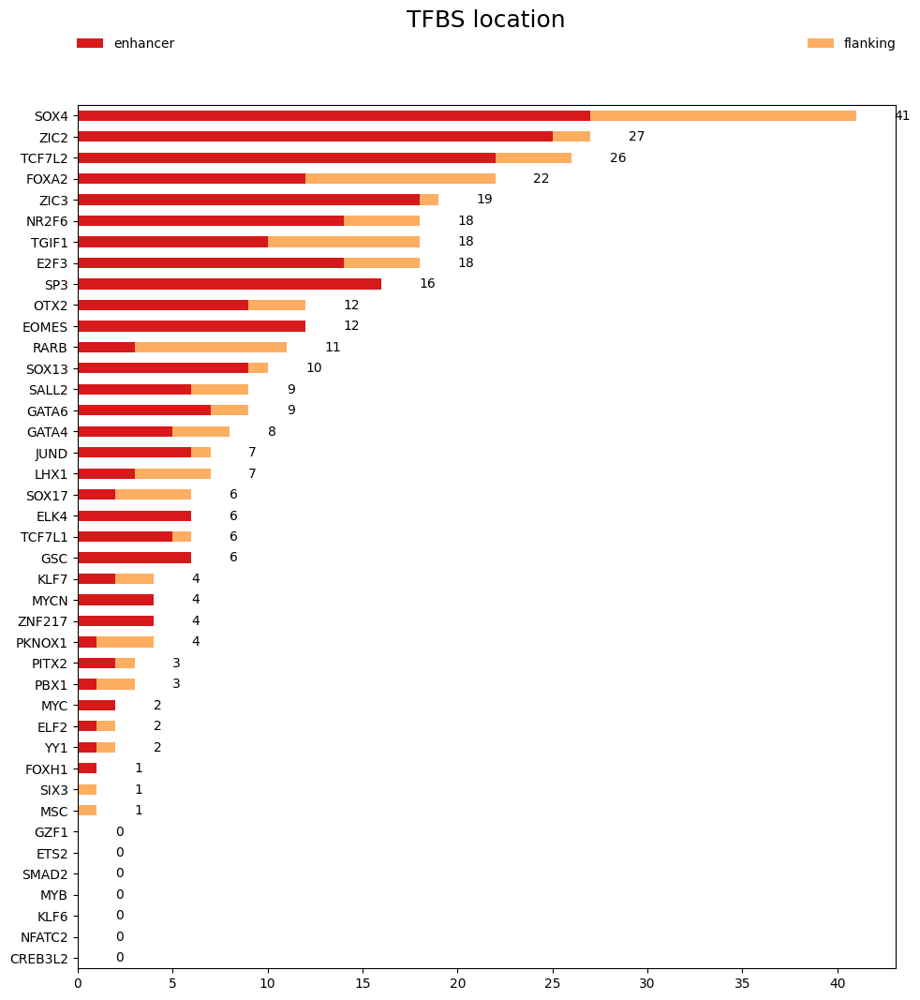

In [511]:
ax = bsDF.plot.barh(align='center', stacked=True, figsize=(12,12), 
                    color = ['#d7191c','#fdae61']) #0571b0
plt.tight_layout()

title = plt.title('TFBS location', pad=60, fontsize=18, color='k')
title.set_position([.5, 1.02])

# Adjust the subplot so that the title would fit
plt.subplots_adjust(top=0.8, left=0.26)
#['#d7191c','#fdae61','#ffffbf','#abd9e9','#2c7bb6']

legend = plt.legend(loc='center',
       frameon=False,
       bbox_to_anchor=(0., 1.02, 1., .102), 
       mode='expand', 
       ncol=2, 
       borderaxespad=-.46,
       prop={'size':10,})

for text in legend.get_texts():
    plt.setp(text, color='k') # legend font color
    
for x,y in enumerate(bsDF.sum(1)):
    plt.text(y + 2, x, '%s'%y, va='center')
    
            
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(10)
    
# plt.axvline(3, color='k', linestyle='--', )
    
#plt.savefig('./'+'TFBS_location'+'.pdf', dpi=100)
# DE

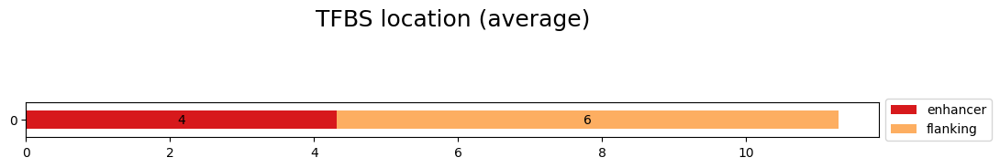

In [501]:
ax = pd.DataFrame(bsDF.mean(0)).transpose().plot.barh(align='center', stacked=True, figsize=(12,0.5),
                                   color = ['#d7191c', '#fdae61'])
# plt.tight_layout()
legend = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
title = plt.title('TFBS location (average)', pad=60, fontsize=18, color='k')

            
for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate(int(width), xy=(left+width/2, bottom+height/2), ha='center', va='center')

plt.savefig('./'+'average_TFBS_location'+'.pdf', dpi=100, bbox_inches = 'tight')

## bubble plot: hierarchy of genes

In [ ]:
# https://zhuanlan.zhihu.com/p/35298352
# https://blog.csdn.net/weixin_46932257/article/details/127269397

In [ ]:
# all genes 
# expressed genes 
# expressed TFs 
# expressed TFs in TADs 
# SE-assigned expressed TFs in TADs 
# auto-regulated TFs 
# candidate CRC TFs

# macs2_Beta: 14739 expressed / 821 expressed TF / 608 candidate TF / 206 candidate TF with SE / 189 TF with motifs
# CRUP_HI-32_0.8: 14781 expressed / 804 expressed TF / 590 candidate TF / 215 candidate TF with SE / 192 TF with motifs
# macs2_HI-32: 14781 expressed / 804 expressed TF / 590 candidate TF / 380 candidate TF with SE / 336 TF with motifs


In [219]:
geneHierarchy = {'all genes': 22140,
                 'expressed genes': 14760,
                 'expressed TFs': 813,
                 'expressed TFs in TADs': 599,
                 'SE-assigned expressed TFs in TADs': 211,
                 'auto-regulated TFs': 60,
                 'candidate CRC TFs': 15}
geneHierarchyDF = pd.DataFrame(geneHierarchy.values(), index=geneHierarchy.keys()).transpose()
geneHierarchyDF

,all genes,expressed genes,expressed TFs,expressed TFs in TADs,SE-assigned expressed TFs in TADs,auto-regulated TFs,candidate CRC TFs
0,22140,14760,813,599,211,191,15


In [315]:
labels = ['all genes', 'expressed genes', 'expressed TFs', 'expressed TFs in TADs', 
          'SE-assigned expressed TFs in TADs', 'auto-regulated TFs', 'candidate CRC TFs']
data = [22140, 14760, 813, 599, 211, 60, 15]
# [round(float(i)*1.5) for i in data]
radius = [round(np.sqrt(i))*200 for i in data]
y = [0 for i in range(0,7)]

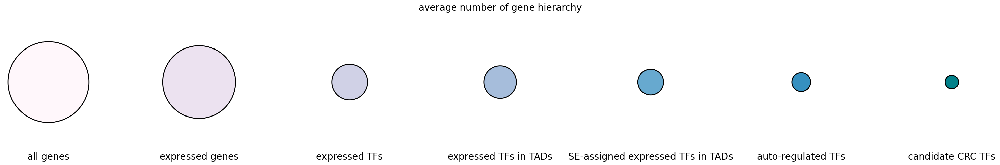

In [317]:
fig, ax = plt.subplots(figsize=(30,5), dpi=100)
# 设置坐标系背景色
# fig.set_facecolor('#EAE0D5')
# 设置坐标系背景色
# ax.patch.set_facecolor('#EAE0D5')
color = ['#fff7fb','#ece2f0','#d0d1e6','#a6bddb','#67a9cf','#3690c0','#02818a',]
# ['#02818a','#3690c0','#67a9cf','#a6bddb','#d0d1e6','#ece2f0','#fff7fb',]

scatter = ax.scatter(x = labels, y = y, s = radius, 
                     edgecolors='k', color=color, linewidths=2., alpha=1, label=labels)

# 设置x轴名称和字体大小
# ax.set_xlabel('', fontsize=50, alpha=0.5)
# 设置标题
ax.set_title(label = 'average number of gene hierarchy', fontsize=20)
# 在y = 0的位置绘制水平直线，做x轴
# ax.axhline(y=0, ls='-', c='black', alpha=0.5)
# 设置轴刻度标签
ax.set_yticks([])  # 设置为空

# 关闭四周边框
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', which='both', length=0, labelsize=20)  # 不显示两轴刻度线

# ax.legend(fontsize=12)

# legend = ax.legend(*scatter.legend_elements(), loc="upper right", title="class")
#handles, label = scatter.legend_elements(prop="sizes", alpha=0.6)
#legend = ax.legend(handles, loc="upper right", title="class")

# ax.add_artist(legend)
plt.tight_layout()
plt.savefig('./'+'TF hierarchy'+'.pdf', dpi=100)
plt.show()

In [442]:
labels = ['hg19 reference genome', 'hg19 TAD', 'preprocessed TAD']
data = [3036303846, 2803136782, 2770736782]
# [round(float(i)*1.5) for i in data]
radius = [round(np.sqrt(i)/2) for i in data]
y = [0 for i in range(0,3)]

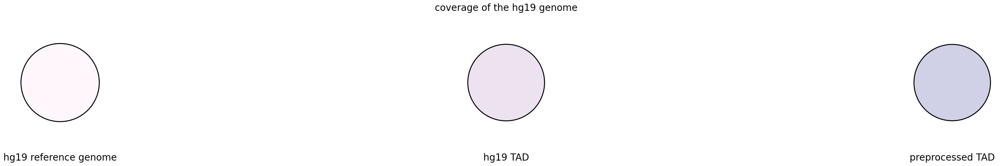

In [445]:
fig, ax = plt.subplots(figsize=(30,5), dpi=100)
# 设置坐标系背景色
# fig.set_facecolor('#EAE0D5')
# 设置坐标系背景色
# ax.patch.set_facecolor('#EAE0D5')
color = ['#fff7fb','#ece2f0','#d0d1e6']
# ['#02818a','#3690c0','#67a9cf','#a6bddb','#d0d1e6','#ece2f0','#fff7fb',]

scatter = ax.scatter(x = labels, y = y, s = radius, 
                     edgecolors='k', color=color, linewidths=2., alpha=1, label=labels)

# 设置x轴名称和字体大小
# ax.set_xlabel('', fontsize=50, alpha=0.5)
# 设置标题
ax.set_title(label = 'coverage of the hg19 genome', fontsize=20)
# 在y = 0的位置绘制水平直线，做x轴
# ax.axhline(y=0, ls='-', c='black', alpha=0.5)
# 设置轴刻度标签
ax.set_yticks([])  # 设置为空

# 关闭四周边框
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', which='both', length=0, labelsize=20)  # 不显示两轴刻度线

# ax.legend(fontsize=12)

# legend = ax.legend(*scatter.legend_elements(), loc="upper right", title="class")
#handles, label = scatter.legend_elements(prop="sizes", alpha=0.6)
#legend = ax.legend(handles, loc="upper right", title="class")

# ax.add_artist(legend)
plt.tight_layout()
plt.savefig('./'+'genome coverage'+'.pdf', dpi=100)
plt.show()

## peak color

In [178]:
from math import log

In [ ]:
# MAFA 共0个bs 1.0 - 0.00172136
# peak position, target, binding site, source
('chr8:144510765-144512040', 'MAFA', 'chr8:144511042-144511058', 'MAFA'), 0, 0.056472
('chr8:144518715-144520143', 'MAFA', 'chr8:144519322-144519336', 'MAFA'), 0, 0.009742
('chr8:144521471-144522888', 'MAFA', 'chr8:144521617-144521633', 'MAFA'), 0, 0.054648
('chr8:144527697-144529884', 'MAFA', 'chr8:144528601-144528617', 'MAFA'), 0, 0.007284

In [ ]:
# NKX2-2 共2个bs 0.999916 - 0.000140569
('chr20:21492139-21494714', 'NKX2-2', 'chr20:21492220-21492236', 'NKX2-2'), 1, 0.321077
('chr20:21516658-21518141', 'NKX2-2', 'chr20:21517229-21517245', 'NKX2-2'), 1, 0.030119
array([['chr20:21492639-21492984', 0.68455],
       ['chr20:21493913-21494214', 0.321077],
       ['chr20:21502248-21503291', 0.437462],
       ['chr20:21503535-21504209', 0.329262],
       ['chr20:21514712-21515146', 0.255518],
       ['chr20:21517158-21517641', 0.0301191],]
0.68455, 0.321077, 0.437462, 0.329262, 0.255518, 0.0301191

In [191]:
def normalize(x,a,b):
    max_x=max(x)
    min_x=min(x)
    return (x-min_x)/(max_x-min_x)*(b-a)

In [299]:
normalize(np.array([60,70,80,90,100]), 0, 8)

array([0., 2., 4., 6., 8.])

In [300]:
for i in [0.056472, 0.009742, 0.054648, 0.007284]:
    print(-log(i))
dd7496
cb2587
dc7194
c81986

2.874010338888966
4.631308843597786
2.906842661552589
4.922075117116775


In [301]:
for i in [0.68455, 0.321077, 0.437462, 0.329262, 0.255518, 0.0301191]:
    print(-log(i))
ffc7d0
fdb2be
ffbcc6
fdb2be    
f8a8b8
d6598f

0.37899359090237206
1.1360743092282144
0.8267654340996251
1.1109014925536547
1.364462421722022
3.502595756974962


In [189]:
colors

['#fb9a99', '#33a02c', '#1f78b4']

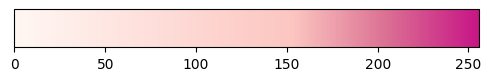

In [292]:
colors = ['#fff7f3', '#fcc5c0', 'palevioletred', 'mediumvioletred']
nodes = [0, 0.6, 0.8, 1]
BetaCRCcmap = mcolors.LinearSegmentedColormap.from_list('cmap1', list(zip(nodes, colors)))
show_cmap(BetaCRCcmap)

## Network

In [196]:
betaAuto = parseTable('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/Beta_AUTOREG_top4%_mod.txt', '\t')
betaEdges = parseTable('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/Beta_EDGES_top4%_mod.txt',  '\t')
betaCRC = parseTable('../CRCmapper/2-2-TRAP.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext0/Beta_CRC_SCORES_top4%_mod.txt',  '\t')


In [202]:
betaCRC[0][0]

"['MNX1', 'SREBF1', 'MAFA', 'ZNF697', 'NFIC', 'FOXA2']"

In [ ]:
def networkInfo(edges, crc, ):
    degreeDict = {}
    for edge in edges:
        TF1 = edge[0]
        TF2 = edge[1]
    
    if TF1 not in degreeDict.keys():
            degreeDict[TF1] = 0
            degreeDict[TF1] += 1
        else:
            degreeDict[TF1] += 1
            
    edgeDict = {}
    

In [ ]:
def plotDegree2(edges, title, cmap, figsize=(25, 25), vmax=None):
    
    ### 1. count degree
    degreeDict = {}
    for edge in edges:
        TF1 = edge[0]
        TF2 = edge[1]

        if TF1 not in degreeDict.keys():
            degreeDict[TF1] = 0
            degreeDict[TF1] += 1
        else:
            degreeDict[TF1] += 1

    ### 3. into sorted df
    degree = pd.DataFrame(degreeDict.items(), columns=['TF','degree'])
    # degree = pd.DataFrame.from_dict(degreeDict, orient='index')
    degree.sort_values(by=['degree', 'TF'], ascending=[False, True], inplace=True)
    print(f'top 5 TF: \n{degree.head(5)}')
    
    ### 4. plot degree heatmap
    plt.figure(figsize=figsize, dpi=100)
    plt.title(title, fontsize=16)
    cbar_kws = {'shrink':0.5,}
    kwargs = {'alpha':.75, 'linewidths':0.0, 'linecolor':'k', 'cmap': cmap, 'vmin': 0, 'vmax': vmax,
              'clip_on':False, 'annot': True, 'fmt':'g', 'square': True, 'xticklabels': False,
              'yticklabels': degree['TF'].to_list(),
              'cbar_kws': cbar_kws}
    # sns.heatmap([degree['degree'].to_list()], **kwargs)
    ax = sns.heatmap(np.array([degree['degree'].to_list()]).T, **kwargs)
    ax.tick_params(axis='both', which='both', length=0)
    # ax.axis('scaled')
    
    plt.tight_layout()
    plt.yticks(rotation=0)
    plt.savefig('./thesis_fig/'+'_'.join(title.split())+'.pdf', dpi=100,)  # bbox_inches='tight'
    plt.show()
    
    return degree



---

## list

### Beta

In [340]:
beta_paper = sorted(degree_paper.TF.values)

In [334]:
betaAuto = parseTable('../CRCmapper/2-2.crc_Beta_narrow.05_broad.1_incltss_cutoff500_ext500/Beta_AUTOREG.txt', '\t')
beta = []
for i in betaAuto:
    if (i[0] != "") and (i[0] not in beta):
        beta.append(i[0])

In [ ]:
for i in paper:
    if i not in beta:
        print(i)

In [337]:
for i in beta:
    if i not in paper:
        print(i)

DBP
RFX1


### DE

In [342]:
de_paper = sorted(degree_paper.TF.values)

In [345]:
deAuto = parseTable('../CRCmapper/6-1.crc_DE_narrow.05_broad.05_exclNMtss_cutoffSE_ext500/DE_H3K27ac_AUTOREG.txt', '\t')
de = []
for i in deAuto:
    if (i[0] != "") and (i[0] not in de):
        de.append(i[0])

In [352]:
for i in de_paper:
    if i in de:
        print(i)

E2F3
EOMES
FOXA2
GATA4
GATA6
GSC
JUND
KLF7
LHX1
MYCN
NR2F6
OTX2
PBX1
PITX2
PKNOX1
RARB
SOX17
SOX4
SP3
TCF7L1
TCF7L2
TGIF1
ZIC2
ZIC3
ZNF217


In [349]:
for i in de:
    if i not in de_paper:
        print(i)

NR2F6
ZNF217
TCF7L1
GSC
PITX2
SOX4
LHX1
RARB
OTX2
EOMES
ZIC3
ZIC2
MYCN
JUND
SP3
SOX17
GATA6
GATA4
PKNOX1
PBX1
FOXA2
E2F3
TCF7L2
KLF7
TGIF1


### Beta macs2

In [377]:
betaAuto = parseTable('../CRCmapper/3-1-TRAP.crc_CRUP_HI-32_K27ac_incltss_peakCutoff.8_cutoffSE_ext0/CRUP_HI-32_K27ac_AUTOREG_top4%.txt', '\t')
# betaAuto = parseTable('../CRCmapper/1-1.crc_CRUP_HI-32_K27ac_incltss_cutoffSE_ext500/H3K27ac_HI-32_AUTOREG.txt', '\t')
beta = []
for i in betaAuto:
    if (i[0] != "") and (i[0] not in beta):
        beta.append(i[0])

In [378]:
len(set(beta) & set(beta_paper))

26

In [382]:
for i in beta:
    if i not in beta_paper:
        print(i)

FOXP2
HNF1A
HSF4
KLF9
MAFB
NFIC
PLAGL2
RORC
SATB1
ZKSCAN1
ZNF34
